# Clip for Visual Grounding

---

Author:
- **Luca Zanolo**  
  _Email:_ luca.zanolo@studenti.unitn.it  
  _Student ID:_ 238838

---

## Introduction

This project implements a framework for the visual grounding task. The dataset used is RefCOCOg, which consists of image-text pairs with referring expressions. The goal is to train a model that predicts bounding boxes corresponding to objects referenced in textual descriptions.

The approach is based on the CLIP (Contrastive Language-Image Pretraining) model, which is adapted for visual grounding tasks. The project is organized into the following steps:

1. Development of a dataset management class for loading and preprocessing the RefCOCOg dataset.
2. Implementation of a baseline method using a combination of CLIP in zero-shot mode and different object detection models for bounding box proposals.
3. Implementation of a CLIP based model with custom training pipeline to make te model usable for visual grounding task.


---

## Setup Instructions



This notebook can be directly used on Google Colab. The only requirement is to execute the next cell of code first.

### Local usage

If used locally within the repository, run the following command:

```bash
bash scripts/vm_setup.sh
```

This command will create a virtual environment and perform the same steps as the next notebook cell. After that, select the appropriate kernel to use the notebook.

If the notebook is used locally without the repository, run the following commands, and then execute the next notebook cell to finish setting up the environment:

```bash
python3 -m venv .venv
source .venv/bin/activate
pip install ipykernel
```

Thus, the following notebook cell must be run if this notebook is not opened from within the main repository or is opened on Google Colab. It sets up the environment for executing each part of the notebook and inspecting the code and experiments. Specifically, the script performs the following steps:

1. Clone the repository to access the code and other resources.

2. Install the required dependencies in a Python virtual environment (or not in a virtual environment if using Google Colab).

3. Download and extract the dataset. This step is optional, but the code requires a **dataset/** folder containing the unzipped **refcocog** dataset for proper execution.

4. Create the necessary directories for models, outputs, and logs.

5. Download the experiment model weights from Google Drive.


In [1]:
import os
import tarfile
import sys

# Set to False in order to avoid download refcocog dataset (~13 GB) 

DOWNLOAD_DATASET =  True
REPOSITORY_NAME = 'visual-grounding-project'

if 'google.colab' in sys.modules and not os.path.basename(os.getcwd()) == REPOSITORY_NAME:
    !git clone https://github.com/LcaZl/visual-grounding-project.git
    os.chdir(REPOSITORY_NAME) # Set the downloaded repo as root, for correct import and links in subsequent cells

!pip install ipykernel ftfy regex jupyter wheel opencv-python scikit-learn numpy matplotlib pandas tabulate tqdm seaborn PyYAML torch torchvision torchaudio gdown
!pip install git+https://github.com/openai/CLIP.git

# Setup project output folders

os.environ['TORCH_HOME'] = "./models"
sys.path.append(os.path.abspath('./'))
os.makedirs("matrices", exist_ok=True)
os.makedirs("models", exist_ok=True)
os.makedirs("output", exist_ok=True)
os.makedirs("dataset", exist_ok=True)
os.makedirs("output/ClipVS_experiments", exist_ok=True)
os.makedirs("logs", exist_ok=True)

# Set up the dataset paths and URL
DATASET_DIR = "./dataset"
REFCOCOG_DIR = os.path.join(DATASET_DIR, "refcocog")
DATASET_FILE = os.path.join(DATASET_DIR, "refcocog.tar.gz")
DATASET_GOOGLE_DRIVE_URL = "https://drive.google.com/uc?id=1xijq32XfEm6FPhUb7RsZYWHc2UuwVkiq"

import gdown


if not os.path.exists(DATASET_DIR):
    print("Creating dataset folder...")
    os.makedirs(DATASET_DIR)

# Check if the RefCOCOg dataset already exists as a folder
if not os.path.exists(REFCOCOG_DIR) and DOWNLOAD_DATASET:
    # If not, check if the .tar.gz file is present, otherwise download it
    if not os.path.exists(DATASET_FILE):
        print("Downloading RefCOCOg dataset...")
        gdown.download(DATASET_GOOGLE_DRIVE_URL, DATASET_FILE, quiet=False)

    # Extract the dataset
    print("Extracting dataset...")
    with tarfile.open(DATASET_FILE, "r:gz") as tar:
        tar.extractall(path=DATASET_DIR)

    print("Cleaning up...")
    os.remove(DATASET_FILE)
else:
    print("RefCOCOg dataset already exists. Skipping download.")


# Map weights to their respective paths
weights_and_paths = {
    "https://drive.google.com/file/d/1NbaRSJ_2a7r10mDUdIi7ZlxXodtzUaxt/view?usp=sharing" : "output/ClipVS_experiments/experiment_1_maintr/model_weights.pth",
    "https://drive.google.com/file/d/1SvsI6pNJmxaxImFkJ93B8uLO5Sjk5TS7/view?usp=sharing" : "output/ClipVS_experiments/experiment_2_maintr/model_weights.pth",
    "https://drive.google.com/file/d/1hS2RLcoFFTK4VW30M41kzkyidTyobCGM/view?usp=sharing" : "output/ClipVS_experiments/experiment_31_maintr/model_weights.pth",
    "https://drive.google.com/file/d/1mK88HOOIklbd-UXJ7yTAwVtNqyu8NQ_6/view?usp=sharing" : "output/ClipVS_experiments/experiment_32_maintr/model_weights.pth",
}

# Download all weights if not already present
print("Downloading experiments models weights ...\n")
for weights_url, path in weights_and_paths.items():
    
    if os.path.exists(path):
        print(f"File already exists at {path}. Skipping download.")
        continue


    # Extract the file ID from the URL
    file_id = weights_url.split('/d/')[1].split('/')[0]
    download_url = f"https://drive.google.com/uc?id={file_id}"
        
    print(f"Downloading weights from {weights_url} to {path}...")
    gdown.download(download_url, path, quiet=False)
    print(f"Downloaded to {path}.")


print("Environment setup complete.")


/bin/bash: line 1: /home/luca/Desktop/DL_delivery/visual-grounding-project/.venv/bin/pip: cannot execute: required file not found
/bin/bash: line 1: /home/luca/Desktop/DL_delivery/visual-grounding-project/.venv/bin/pip: cannot execute: required file not found
RefCOCOg dataset already exists. Skipping download.

File already exists at output/ClipVS_experiments/experiment_1_maintr/model_weights.pth. Skipping download.
File already exists at output/ClipVS_experiments/experiment_2_maintr/model_weights.pth. Skipping download.
File already exists at output/ClipVS_experiments/experiment_31_maintr/model_weights.pth. Skipping download.
File already exists at output/ClipVS_experiments/experiment_32_maintr/model_weights.pth. Skipping download.
Environment setup complete.


---

## Project code organization



The code for this project is organized into separate modules rather than being directly included in the notebook. This approach was chosen to:

- Avoid creating an excessively large notebook.

- Facilitate the development, testing and reuse of individual components.

- Maintain a clear organization by separating code based on its functionality.


### Repository Structure
For detailed inspection, the code is located in the **src** folder of the repository and organized into the following subdirectories:

- **baseline/**: Contains code for the baseline model.

- **ClipVS/**: Code for ClipVS model. Includes scripts for model training, validation and testing.

- **dataset/**: Provides functions for loading and preprocessing the RefCOCOg dataset.

- **debug/**: Contains utilities for inspecting and debugging various project components.

- **utils/**: General-purpose functions for logging and file system operations.

**Note:** the next links to the scripts of each presented components, in markdown cells, won't work on Google Colab. Is possible to manually open the scripts corresponding to each component by looking inside the downloaded repository **src** folder.

---

## Modules

Here the necessary modules, functions and classes are imported.

In [2]:
# Automatically reload components -> avoid to run this cell after each change to scripts.

%load_ext autoreload
%autoreload 2

from clip import clip
from torch.utils.data import DataLoader
import torch
import torchvision
import pandas as pd

from src.dataset.dataset import refcocog

from src.baseline.model import baselineCLIP
from src.baseline.evaluation import iou_accuracy
from src.baseline.evaluation import evaluate, collate_fn_bs

from src.ClipVS.model import ClipVS
from src.ClipVS.evaluation import experiment
from src.ClipVS.batch_preparation import collate_fn
from src.ClipVS.postprocessing import postprocessing
from src.ClipVS.loss import custom_loss

from src.utils.os_interaction import load_experiment_config
from src.utils.os_interaction import save_performance_to_csv
from src.utils.grid_search import grid_search
from src.utils.output_inspection import show_grid_search_results
from src.utils.output_inspection import analyze_csv
from src.utils.utils import test_forward_pass

from src.debug.debug_dataset import dataset_details, sample_info
from src.debug.debug_baseline import debug_baseline_output
from src.debug.debug_clipvs import debug_tensors, debug_tensor_transformation, debug_plotting

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Uncomment to save all the output of this notebook to a new log file
# Rerun this cell to create a new log file.

#from src.utils.logger import setup_logger
#setup_logger() 

---

## Configurations

To manage all the necessary parameter for each part of the project in a centralized way there is a configuration.yaml file where keys are organized with predefined prefixes:

- **dt_**: settings related to the dataset

- **dt_ess_sm_**: settings for the dataset similarity matrix used to enhance sentences.

- **nn_**: settings for the main model of the project

- **bs_**: settings for the baseline model

- **no prefix**: general settings such as the dataset path and the output paths.


[Configuration File](configuration.yaml)

The current configuration of the pipeline is loaded with the following cell.

In [3]:
# Load parameters into a dict

config_path = "configuration.yaml"
config = load_experiment_config(config_path)

---

## Dataset

[Dataset class](src/dataset/dataset.py)

The dataset is entirely managed within the **refcocog** python class.
This class is a custom implementation of a PyTorch Dataset designed for the RefCOCOg dataset. It enables loading, processing and retrieval of data samples for training or evaluation. It specifically supports the UMD-split version of RefCOCOg.

### Configuration

It's configuration parameters are the following:

- **dt_splits** (test, train, val) : specify the split of the dataset to load.

- **dt_samples_limit** ([0-100]) : specify the percentage of samples to load for each specified split.
- **dt_full_test_set** (True, False) : control if the test split must be loaded entirely, despite the - **dt_samples_limit** parameter. 
- **dt_templates** : list of template such as 'a photo of {}' or '{} in the picture' that cna be used to enhance the sentences of refcocog dataset.

- **dt_apply_template** (True, False) : control if the templates specified in **dt_templates** must be emplyed or not.

- **dt_sents_vector_type** (Mean, NoMean) : this parameter control how the sentences will be aggregated in each sample. Used to check the sentences produced with the two methods while devoloping the dataset class.




### Similarity matrix



[Similarity matrix class](src/dataset/similarity_matrix.py)

The similarity matrix is based on cosine similarity measure and involve each pair of sentences of the same split of the dataset loaded. This method was employed with the aim of enhance the information related to each sample that can be extracted from the dataset. From this matrix is possible to extract the top-K most similar sentences for each sentence, where K is controlled with **dt_ess_sm_k**. 

#### Configuration

- **dt_extra_similar_sents** (True, False) : this parameter control if its necessary to compute the similarity matrix based between the dataset splits sentences in order to add to each sample the most similar sentences.

- **dt_ess_sm_path** : path where the similarity matrix will be stored or from which it will be loaded.
- **dt_ess_sm_k** : number of most similar sentences to add to each sample. 
- **dt_ess_sm_batch_size** : due to the high dimensionality of this similarity matrix it is computed leveraging GPU computing and this parameter control the size of the batch of sentences to process at a time.


The subsequent cell can be used to instantiate a dataset with the current configuration parameters.

In [5]:
CLIP_MODEL, CLIP_IMAGE_PREPROCESS = clip.load("RN50", device=config["device"])
CLIP_TOKENIZE = clip.tokenize
verbose = config["verbose"]
device = config["device"]
    
dataset = { split : refcocog(config, split, CLIP_TOKENIZE, CLIP_IMAGE_PREPROCESS, CLIP_MODEL) for split in config["dt_splits"] }

Loading dataset refcocog for test...
Sanity check ...
Loading Refcocog (test) using 25/5023 samples.
/home/luca/Desktop/DL_delivery/visual-grounding-project/matrices/test_sim_matrix_limited_s0.5.npz, exists -> False

Computing similarity matrix.


Batched similarity computation: 100%|██████████| 1/1 [00:00<00:00, 25.82it/s]


Similarity matrix computed. Compressing ...
Similarity matrix compressed and saved.
Computing top-k most similar sentences for each sentence.

refcocog Dataset loaded with 25 samples!
Loading dataset refcocog for train...
Sanity check ...
Loading Refcocog (train) using 211/42226 samples.
/home/luca/Desktop/DL_delivery/visual-grounding-project/matrices/train_sim_matrix_limited_s0.5.npz, exists -> False

Computing similarity matrix.


Batched similarity computation: 100%|██████████| 1/1 [00:00<00:00, 988.29it/s]


Similarity matrix computed. Compressing ...
Similarity matrix compressed and saved.
Computing top-k most similar sentences for each sentence.

refcocog Dataset loaded with 211 samples!
Loading dataset refcocog for val...
Sanity check ...
Loading Refcocog (val) using 12/2573 samples.
/home/luca/Desktop/DL_delivery/visual-grounding-project/matrices/val_sim_matrix_limited_s0.5.npz, exists -> False

Computing similarity matrix.


Batched similarity computation: 100%|██████████| 1/1 [00:00<00:00, 2526.69it/s]

Similarity matrix computed. Compressing ...
Similarity matrix compressed and saved.
Computing top-k most similar sentences for each sentence.

refcocog Dataset loaded with 12 samples!


#### Dataset inspection

This cell generate a detailed output about the content and organization of the dataset split specified. It will show the internal structures and the similarity matrix if available, with an example of similar sentences. Then a report about the content of a single sample is also produced, to present the information carried by each sample. The sample shown can be controlled with the **sample_id** parameter.


TEST DATASET refcocog (umd) INFO:
 - description: This is stable 1.0 version of the 2014 MS COCO dataset.
 - url: http://mscoco.org
 - version: 1.0
 - year: 2014
 - contributor: Microsoft COCO group
 - date_created: 2015-01-27 09:11:52.357475
 - Dataset licenses:
1 - Attribution-NonCommercial-ShareAlike License -> http://creativecommons.org/licenses/by-nc-sa/2.0/
2 - Attribution-NonCommercial License -> http://creativecommons.org/licenses/by-nc/2.0/
3 - Attribution-NonCommercial-NoDerivs License -> http://creativecommons.org/licenses/by-nc-nd/2.0/
4 - Attribution License -> http://creativecommons.org/licenses/by/2.0/
5 - Attribution-ShareAlike License -> http://creativecommons.org/licenses/by-sa/2.0/
6 - Attribution-NoDerivs License -> http://creativecommons.org/licenses/by-nd/2.0/
7 - No known copyright restrictions -> http://flickr.com/commons/usage/
8 - United States Government Work -> http://www.usa.gov/copyright.shtml

Instances:
 - keys: dict_keys(['info', 'images', 'licenses', 

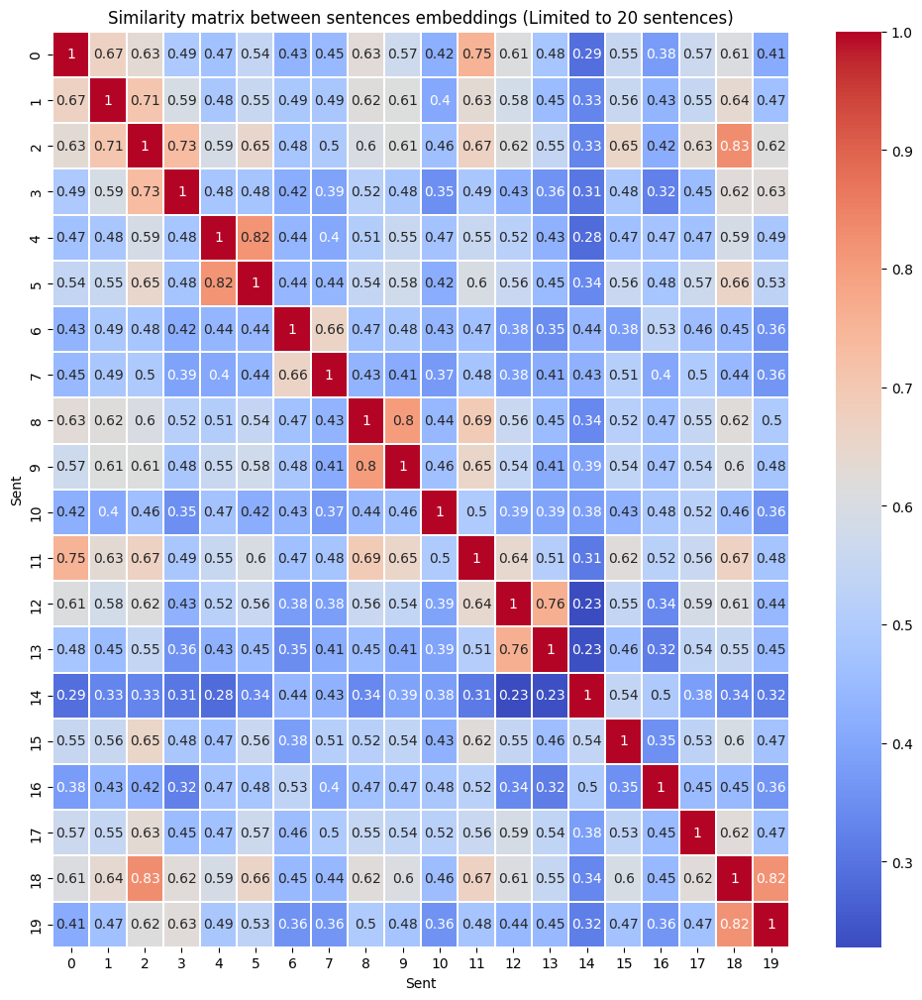

Sample 1 information:
Sample dataframe (sample_df)


 ┌───────────────┬──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│               │ 1                                                                                                                                                                                                                                                                      

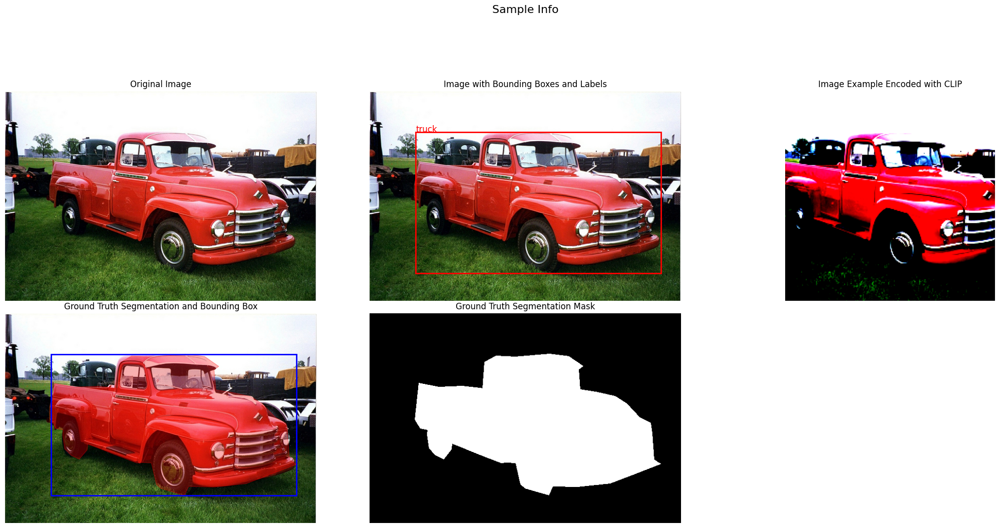

In [6]:
dataset_details(dataset['test'])
sample_info(dataset['test'], sample_id = 1)

---
---

## Baseline

The baseline model was devoloped as described in the assignment. It's a pytorch training-free Model which leverage clip zero shot and object detection models to accomplish the visual grounding task. Intially devoloped only leveraging Yolo model for object detection it was then exteded to use also Single-Shot Detector (SSD) and Faster R-CNN (FRCNN) models to detect objects withing the image. In order to have a comparison on the impact of using different object detection models.

[Baseline model](src/baseline/model.py)


The following schema illustrate the workflow of the baseline model.

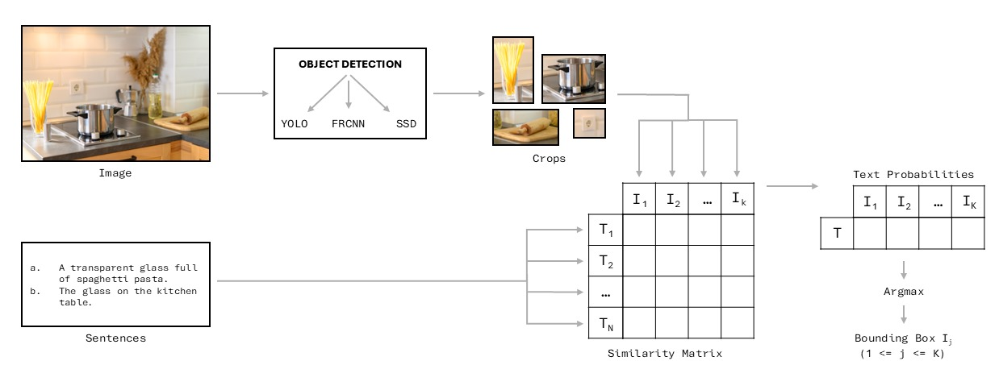



In the schema the input picture is prepared and then processed with one of the 3 available object detection model. This process produces in output a series of images which rapresent crops of the objects identified by the model inside the main image. These crops are firstly filtered to keep only the ones with a confidence threshold above 50%. Then the remaining crops are used by the model to build the similarity matrix against the given sentences. Afterthat, the probabilities on sentences dimension are aggregated by averaging, producing a matrix with a single row and a column for each crop.
At the end, the crop that most probabily contain the object described by the given texts is identified as the one with the highest probability values in its cell and returned as model output.

#### Configuration
The configuration parameters of the baseline model are the following:

- **bs_supp_model** (Yolo, SSD, FRCNN) : Object detection model 

- **bs_sents_vector_type** (Mean, NoMean) : how to generate the sentences embeddings for each image. With Mean the CLIP sentences embedding are averaged into a single vector, with NoMean instead all the available sentences are kept encoded in different vectors (identical as **dt_sents_vector_type**, but drive how model use the sentences).


Use the following code to instantiate the baseline model.



In [7]:
# Load the external object detection models

yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5x6', pretrained=True).eval().to(config["device"])
frcnn_model = torchvision.models.detection.retinanet_resnet50_fpn(weights='DEFAULT').eval().to(config["device"])
ssd_model = torchvision.models.detection.ssd300_vgg16(weights='DEFAULT').eval().to(config["device"])

# Load baseline

baseline = baselineCLIP(config, CLIP_MODEL, CLIP_IMAGE_PREPROCESS, CLIP_TOKENIZE, yolo_model, frcnn_model, ssd_model, True)

Using cache found in ./models/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-1-19 Python-3.12.3 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 5938MiB)

Fusing layers... 
YOLOv5x6 summary: 574 layers, 140730220 parameters, 0 gradients, 209.6 GFLOPs
Adding AutoShape... 


#### Inference on a single sample

With this cell is possible to make inference with the loaded baseline and inspect in detail the output produced. Use **SAMPLE_ID** to try different samples.

Sentences:
 - a white train with a black top
 - a pan with food cooking on the gas
 - a apple desktop computer
 - the white imac computer that is also turned on
Ground truth box : [338.8, 82.19, 147.34, 157.37]
Predicted box    : [231.27444458007812, 69.43171691894531, 348.6064758300781, 190.81785583496094]
Produced output dataframe with Yolo


 ┌────┬────────────┬──────────┬─────────┬──────────┬──────────────┬─────────┬──────────┐
│    │       xmin │     ymin │    xmax │     ymax │   confidence │   class │ name     │
├────┼────────────┼──────────┼─────────┼──────────┼──────────────┼─────────┼──────────┤
│  0 │ 279.212    │ 233.716  │ 445.975 │ 316.477  │     0.924062 │      66 │ keyboard │
├────┼────────────┼──────────┼─────────┼──────────┼──────────────┼─────────┼──────────┤
│  1 │ 462.674    │ 374.105  │ 529.208 │ 410.129  │     0.913741 │      64 │ mouse    │
├────┼────────────┼──────────┼─────────┼──────────┼──────────────┼─────────┼──────────┤
│  2 │ 366.312    │ 333.858  │ 405.1

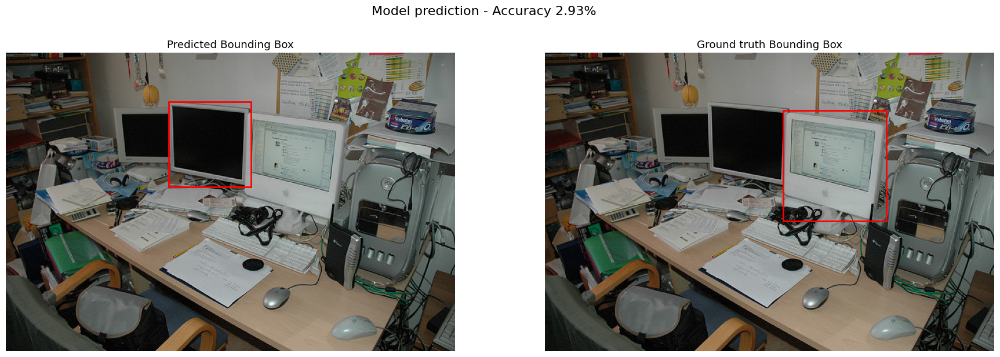

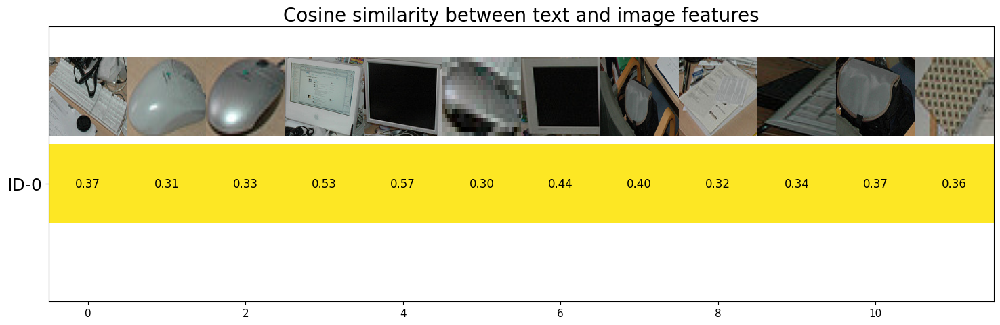

Sentences ID Visualized in Charts.



 ┌────┬──────┬────────────┐
│    │ ID   │ Sentence   │
├────┼──────┼────────────┤
│  0 │ ID-0 │ Mean       │
└────┴──────┴────────────┘




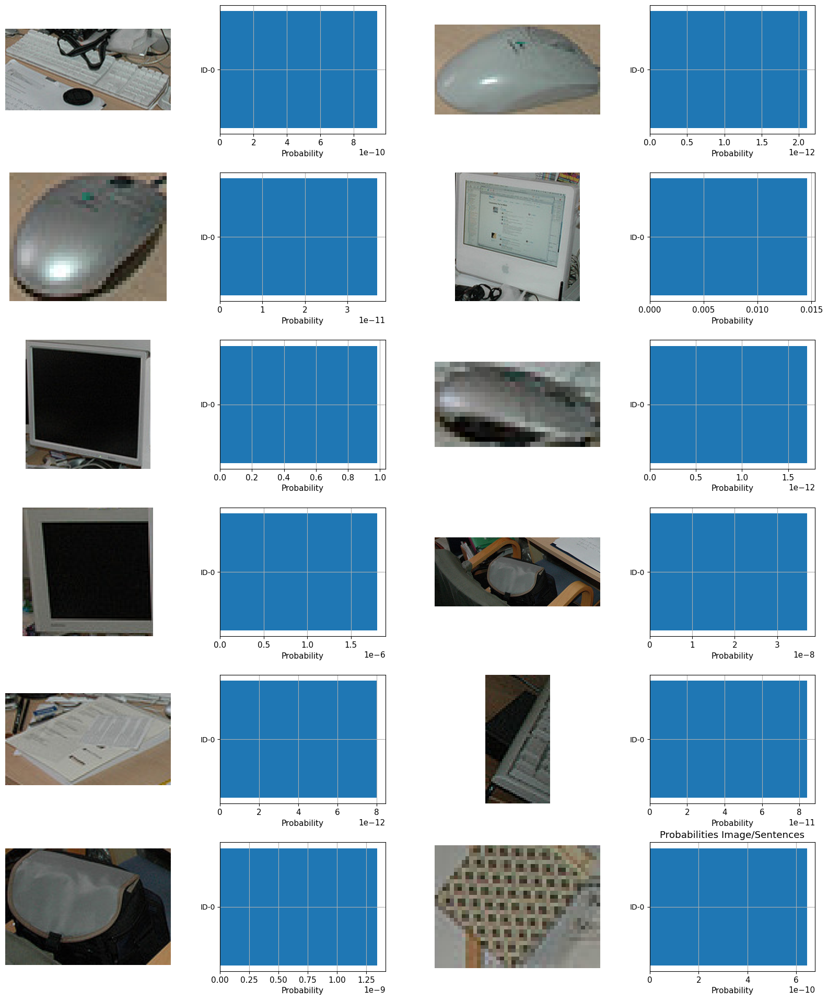

In [8]:
%matplotlib inline

SAMPLE_ID = 2

sample = dataset['test'].__getitem__(SAMPLE_ID)
output = baseline.forward(sample)

output["iou_accuracy"] = iou_accuracy(output["pred_bbox"], sample['gt_bbox'])
debug_baseline_output(config, output, sample)

#### Evaluation on Test Set

[Evaluation function source code](src/baseline/evaluation.py)

This cell allows the baseline to be evaluated on the test split of the dataset. The performance results obtained during the experiment will be stored in the specified `.csv` file.

This cell, as well as the subsequent similar cells for the ClipVS model and grid searches, are optional since the results presented have already been computed. However, they can be used to observe how the procedures work. 

It is possible to adjust the dataset size and other parameters in the configuration file to balance runtime and inspect different combinations. Remember to reload the parameters and dataset if any changes are made.


In [9]:
# Evaluation - Inference on entire test dataset
test_loader = DataLoader(dataset['test'], collate_fn = collate_fn_bs)

baseline.verbose = False
avg_iou_accuracy = evaluate(baseline, test_loader)
config["avg_iou_accuracy"] = round(float(avg_iou_accuracy), 4)

# Performance .csv output
CSV_PATH = f"{config['output_to']}/baseline_tests.csv"
save_performance_to_csv(config, CSV_PATH, exclude_prefix="nn_")

Baseline Evaluation: 100%|██████████| 25/25 [00:02<00:00,  9.99batch/s, IoU Accuracy=0.5467]


#### Grid Search

[Grid search source code](src/utils/utils.py)

The grid search deployed to test different configurations of the dataset and baseline can be executed here. It will consider only the configuration attributes prefixed with **gs_**. Each combination will be used to instantiate a dataset and a baseline, and that combination will be tested on the test split. The results of this search are stored in a `.csv` file.

The results of the grid search with all possible dataset and model configurations are presented in the next section.


In [ ]:
csv_path = f"{config['output_to']}/baseline_grid_search_sl{config['dt_samples_limit']}final.csv"
grid_search(config, dataset, csv_path, model="Baseline")

### Evaluation



#### Metric: intersection over Union (IoU) accuracy

[IoU Accuracy function](src/baseline/evaluation.py)

**IoU** is the metric used to evaluate the baseline. It is defined as:

$$
\text{IoU} = \frac{\text{Area of Overlap}}{\text{Area of Union}}
$$




- **Area of Overlap**: The shared area between the predicted and ground truth bounding boxes or masks.
- **Area of Union**: The total area covered by both boxes or masks, excluding the overlap counted twice.

IoU values range from 0 to 1, where 1 indicates perfect alignment.



### Results Summary



The evaluation involves a grid search over various parameters and dataset configurations. 

Run the next cell to diplay the **topk** experiments that reach the best performance evaluated on the entire test set

In [10]:
show_grid_search_results(csv_file_path = 'output/baseline_grid_search.csv', topk = 10)




 ┌────┬──────┬──────────────────┬──────────┬─────────────┬───────────────────────────┬───────────┬──────────────────────────┬─────────────────┬────────────────────┬──────────────────────────────────────────────────────────────────────────────────────────────────┬──────────────────┬──────────────────┬───────────────────────────┬───────────────────────┬────────────────────────┬────────────────────────┬──────────────────┬──────────────────────────────┬───────────────────────────┬────────────────────────┬──────────┐
│    │   id │ dataset_path     │ device   │ output_to   │ output_model_weights_to   │ verbose   │ Dataset Splits           │   Samples Limit │ dt_full_test_set   │ Templates                                                                                        │ Apply Template   │ dt_ess_sm_path   │ Extra Similar Sentences   │   Similarity Matrix k │   dt_ess_sm_batch_size │ Sentence Vector Type   │ Baseline Model   │ Baseline Sent. Vector Type   │ comb_id                   │

Key findings from the experiments are summarized below:


1. **Object Detection Model Comparison**  
   Among the evaluated object detection models, **YOLO** achieves the highest performance on the test set, as shown in the chart below, consistently outperforming alternatives like Faster R-CNN and SSD in this context.


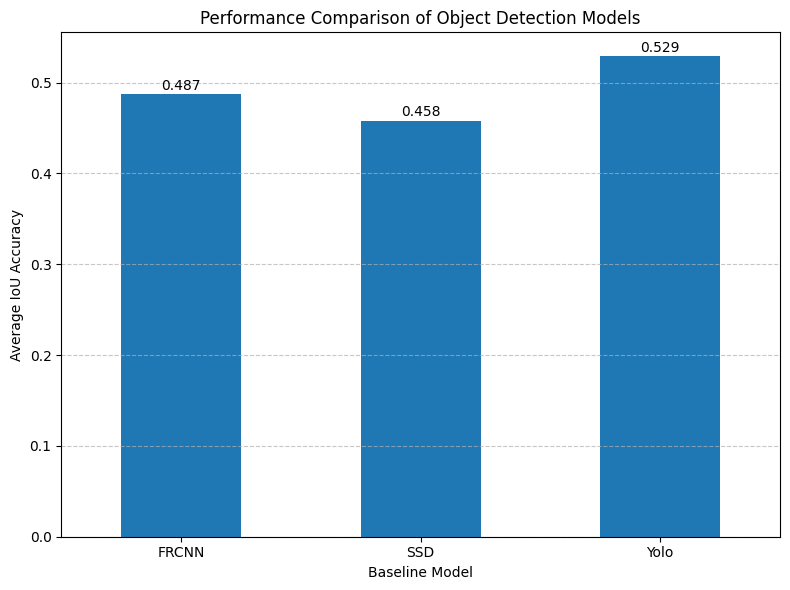



2. **Effect of Extra Similar Sentences (ESS)**  
   Augmenting input data with additional similar sentences accordingly to the similarity matrix does not improve performance. Consequently, this augmentation is not subsequently used.

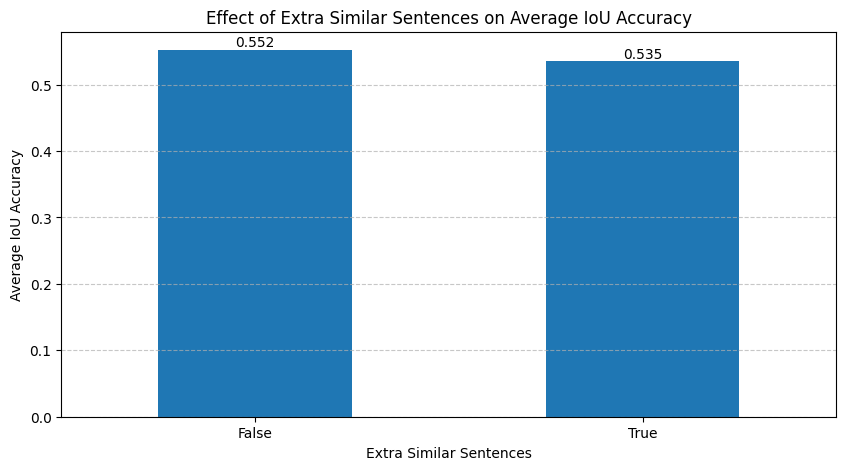

3. **Impact of Templates on Input Text**  
   Applying text templates enhances performance. Therefore, 6/8 of the top-8 configurations rely on text templates, confirming their positive impact on IoU accuracy.

4. **Sentence Vector Type**: All thep configurations use the "Mean" sentence vector type, indicating that this modality is better suited for this task. The chart below inspect and confirm this aspect considering all the grid search results.


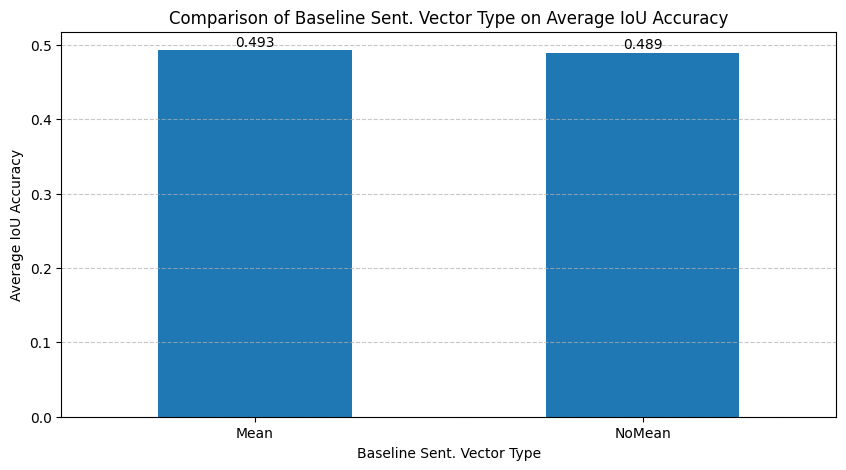

---
---

## CLIP for Visual Grounding: ClipVS

[ClipVS Model](src/ClipVS/model.py)

This project main model is designed to leverage CLIP as backbone and incorporate elements from vision-language researches, with the aim to produce a model for Visual Grounding task. The model general architecture is presented in picture below. It evidence how the multi-modal input are managed through the main components of the architecture.


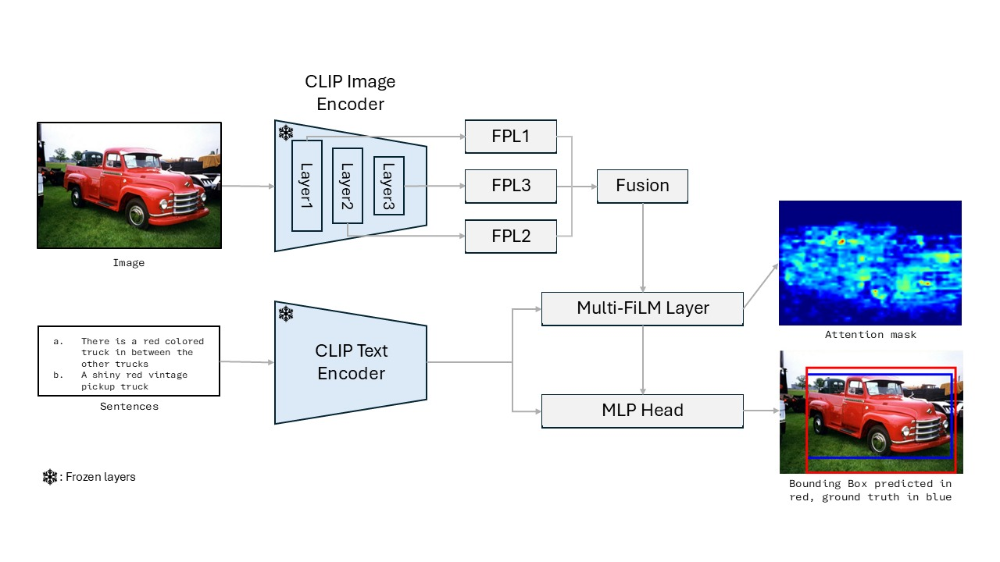



On the left side of the diagram, the inputs are prepared as described in subsequent batch preparation section. Afterthat, both text and images pass through their respective CLIP encoder. For the image input, features are extracted from multiple intermediate layers of the CLIP encoder, inspired by the approach in [1]. These features are then processed through three layers: FPL1, FPL2, and FPL3, which enable their fusion in the Fusion Block. Next, the fused image features are conditioned using the text features from the standard CLIP encoder within a Feature-wise Linear Modulation layer (FiLM). This layer, inspired by the work in [2], modulates the image features by conditioning the attention based on the textual input. The goal is to improve the model's performance in the final step, where the bounding box is predicted. In this step, inside the Multi-Layer perceptron (MLP) head, the text features are used again to provide potentially additional information to the decision.

The model produces two primary outputs:

- **Attention Mask**: This is generated by the FiLM layer and highlights regions in the image likely to contain the object referenced by the text.

- **Bounding Box**: This is predicted using the visual and text features by the MLP head.

The CLIP backbone was kept frozen to avoid destroying the information that already have. Furthermore this choice was also made in [1] where the CLIP encoder are kept frozen.

### Configuration parameters

The parameters related to ClipVS model.

- **nn_reload_weights_from** : path to a .pth file of weight for the model, to reload them.

- **nn_store_model_weights** (True, False): if true the weights of the model are stored into the current experiment folder. 

- **nn_batch_size**: number of samples per batch 

- **nn_epochs**: epochs of training

- **nn_grad_clipping** (True, False) : if true the gradient clipping is activated for the training procedure 

- **nn_use_scheduler** (True, False) : if true the Polynomial Scheduler is used to adjust the learning rate after each epoch 

- **nn_scheduler_power** : power of the scheduler, used only if **nn_use_scheduler** is true.

- **nn_dropout_prob** : dropout probabilities for the MLP head.

- **nn_optimizer**: Optimizer used, fixed to AdamW.

- **nn_bbox_hidden_dim** : Hidden dimension for the MLP head.

- **nn_opt_learning_rate** : Optimizer initial learning rate.

- **nn_wd** : Optimizer weight decay

- **nn_film_layers** : Number of residual block for the Multi-FiLM layer

- **nn_fg_bg_percentile** : Used for the analysis of the attention map produced, this threshold is used to produce a foreground and a background map.

- **nn_giou_lambda** : Lambda for the GIoU loss component.

- **nn_l1_lambda** : Lambda for the Smooth L1 loss component.

- **nn_bce_lambda** : Lambda for the BCE loss component.


---
### Batch preparation


[Batch preparation function](src/ClipVS/batch_preparation.py)

The input batch of the model are prepared using **collate_fn** function with torch DataLoader. The function creates a batch with all the elements necessary for the model's forward pass. As sentences associated with each image can vary in number (1, 2, or 3), padding is applied to ensure compatibility within a batch. The variability in sentence counts is illustrated by the code snippet below:

In [11]:
split2inspect = 'test'
r = pd.DataFrame([{'sample_id':id, 'sentences':len(row['sent_ids'])} for id, row in dataset[split2inspect].samples.iterrows()])
print(f"Number of sentences per image: {r['sentences'].unique()} - On average: {r['sentences'].mean()}")

Number of sentences per image: [2 1] - On average: 1.88


A batch consists of multiple images and their associated sentences. While all images are resized to a fixed dimension and can be directly stacked into a tensor, sentences instead have varying numbers. For instance, if one sample in a batch has 3 sentences while another has only 1, this mismatch in shape prevents the correct creation of a tensor.

To resolve this, padding is applied at the sample level:

- For each sample, padding sentences are added to match the maximum number of sentences in the current batch.

- A padding mask is generated to indicate which sentences in the batch are valid and should be considered by the operations.

---
### Training and evaluation procedure


[Experiments functions](src/ClipVS/evaluation.py)

The model's training and evaluation pipeline is implemented in [this script](src/ClipVS/evaluation.py) and consists of three main scripts:

- **Experiment**: Manages the overall training and evaluation loop across epochs.
    - An experiment folder is created to store results, metrics and model checkpoint.
    - Data loaders for training, validation and testing datasets are initialized with a batch size and a custom collate_fn to handle data preparation.

- **Training Step**:  Implements the logic for a single training step per batch.
    - For each epoch:
        - It iterates through the training data to compute losses and update model parameters.
        - It evaluates the model on the validation dataset to monitor generalization performance.

- **Test Step**:
    - After completing all training epochs, the model is evaluated on the test dataset using the test_step function.

---

### Optimizer, Learning Rate Scheduler and Gradient Clipping


#### 1. Optimizer: AdamW



[Optimizer & Learning rate scheduler](src/ClipVS/optimizer.py)

The AdamW optimizer was adopted since in [1] and in other papers like [2] or [3] it was chosen to drive the optimization operations in similar tasks.


#### 2. Learning Rate Scheduler: PolynomialLR


### Learning Rate Scheduler: Polynomial Decay

The learning rate scheduler is implemented using **PolynomialLR**, which gradually reduces the learning rate over the course of training by following a polynomial decay schedule:

$$
\text{LR}_t = \text{LR}_{\text{init}} \times \left(1 - \frac{t}{T}\right)^\text{power}
$$

#### Parameters:
- **$ \text{LR}_{\text{init}} $**: Initial learning rate.
- **$ t $**: Current step or epoch.
- **$ T $**: Total number of steps or epochs.
- **$ \text{power} $**: A hyperparameter that controls the rate of decay:
  - $ \text{power} < 1 $: Slower decay initially, faster decay toward the end.
  - $ \text{power} = 1 $: Linear decay.
  - $ \text{power} > 1 $: Faster decay initially, slower decay toward the end.

The learning rate scheduler was introduced to dynamically adjust the learning rate during training. A **power** value of **0.7** was selected to achieve the following:

1. **Stable Learning Rate at the Start**: During the initial epochs, a slower decay ensures the learning rate remains stable, allowing the model to gradually adjust and learn effectively without large fluctuations.
   
2. **More Aggressive Updates Later**: Toward the later epochs, the learning rate decreases more aggressively. This approach is designed to push the model out of a potential performance plateau, where it otherwise stop improving.

The decision to use this schedule stems from noticing that the model's performance tends to plateau after the initial epochs in some initial tests, indicating limited learning progress. By gradually adjusting the learning rate, this approach aims to encourage further improvements, rather than maintaining a stable learning rate for the entire the training process.



#### 3. Gradient Clipping


To stabilize training and prevent exploding gradients, gradient clipping is applied. The gradients of all model parameters are clipped to a maximum norm of 1.0:

clip_grad_norm_(net.parameters(), max_norm=1.0)

This mechanism can be controlled within the configurations and the tests made will be presented in next sections.

---
### Loss Components



[Loss functions](src/ClipVS/loss.py)


The model uses a single loss built using different components to try to optimize different aspects of its performance, such as bounding box quality and attention map accuracy. Below are the details of the loss components used.


#### 1. Generalized Intersection over Union (GIoU) Loss



GIoU Loss evaluates the quality of bounding box predictions by penalizing both misalignment and lack of overlap. Unlike standard IoU, GIoU considers the area of the smallest enclosing box, encouraging tighter and more accurate bounding boxes.

**Formula**:  
$$
\text{GIoU} = \text{IoU} - \frac{\text{Area of Enclosing Box} - \text{Area of Union}}{\text{Area of Enclosing Box}}
$$
$$
\text{GIoU Loss} = 1 - \text{GIoU}
$$

This loss helps improve bounding box alignment, especially in cases where predicted boxes barely overlap with the ground truth. Which is a common case, expecially at the start of the training procedure.


#### 2. BCE Loss (Binary Cross-Entropy Loss)


To guide the model in identifying the most relevant image regions, accordingly to given texts, the intermediate attention maps produced are compared against ground truth segmentation masks, available with refcocog dataset. Here, Binary Cross-Entropy (BCE) Loss quantify the similarity between the predicted and true maps. The purpose of the BCE Loss is to encourage the model to focus on key visual areas described by the text, ensuring that the generated attention maps highlight meaningful regions. For example, when the text input is "a cat sitting on a couch," the attention map should emphasize the area around the cat while suppressing other regions. With BCE Loss I tried to enforce this alignment.

**Formula**:  
$$
\text{BCE Loss} = -\frac{1}{N} \sum_{i=1}^N \Big[ y_i \log(p_i) + (1 - y_i) \log(1 - p_i) \Big]
$$

#### 3. L1 Loss (Smooth L1 Loss)



The Smooth L1 Loss complements GIoU by focusing on precise numerical accuracy of the bounding box coordinates. It combines L1 loss's sensitivity with L2 loss's stability, preventing outliers from dominating the optimization.

- When $ ∣diff∣ < 1 $, the loss behaves quadratically $ 0.5 * (diff)^2 $
- When $ ∣diff∣ >= 1 $, the loss transitions to linear $ ∣diff∣ − 0.5 $ to reduce sensitivity to outliers.

**Formula**:  
$$
\text{Smooth L1 Loss} =
\begin{cases}
0.5 * (\text{diff})^2 & \text{if } |\text{diff}| < 1, \\
|\text{diff}| - 0.5 & \text{otherwise},
\end{cases}
$$
Where 
$$
\text{diff} = \text{prediction} - \text{ground truth}
$$


### Custom Loss Function


The custom loss function integrates the above loss components presented to optimize both bounding box prediction and attention map accuracy. Their impact on final loss can be controlled with the parameters: **nn_giou_lambda**, **nn_l1_lambda** and **nn_bce_lambda** in configuration file. The lambda values chosen for the components will be presented in final sections about the experiments made.

**Formula**:  
$$
\text{Total Loss} = \lambda_{\text{GIoU}} \cdot \text{GIoU Loss} +
\lambda_{\text{BCE}} \cdot \text{BCE Loss} +
\lambda_{\text{L1}} \cdot \text{L1 Loss}
$$

**Components**:
1. **GIoU Loss**: Focuses on bounding box quality.

2. **BCE Loss**: Evaluates the accuracy of attention maps.

3. **L1 Loss**: Refines bounding box dimensions.



---
### Architecture

The following section will explain the architecture devoloped.


[ClipVS Model](src/ClipVS/model.py)


#### Image Features Processing

The model processes image features extracted from different layers of CLIP's visual encoder to leverage information at different spatial resolutions, this idea is taken from [1], to better utilize scale information. In other words, the approach enables the model to identify objects of different sizes by combining fine-grained spatial details with high-level information. In particular:

- **Capture Multi-Scale Information**: Lower layers provide high-resolution, fine-grained spatial details, while higher layers contribute semantic context at lower resolutions.

- **Improve Object Detection**: By integrating features from various scales, the model could potentially better identify and localize objects of different sizes.

Features are extracted from the following layers of CLIP's visual encoder:

- **Layer 1**: High-resolution features with 256 channels, useful for capturing small details.

- **Layer 2**: Intermediate features with 512 channels, balancing spatial and semantic information.

- **Layer 3**: Low-resolution features with 1024 channels, focusing on high-level semantic context.


After the extraction from the Clip encoder, the features are transformed to a consistent channel size and spatial resolution that facilitates their combination in downstream fusion task. The FPL layers used to this scope are implemented as follows and this code is located in __init__ method of ClipVS [here](src/ClipVS/model.py).



```python

self.fpl1 = nn.Sequential(
    nn.Conv2d(256, 1024, kernel_size=1),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d(output_size=(56, 56))
)

self.fpl2 = nn.Sequential(
    nn.Conv2d(512, 1024, kernel_size=1),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d(output_size=(56, 56))
)

self.fpl3 = nn.Sequential(
    nn.Conv2d(1024, 1024, kernel_size=1),
    nn.ReLU(inplace=True),
    nn.AdaptiveAvgPool2d(output_size=(56, 56))
)

```


 The image below summarize the functioning of each of the FPL layers.


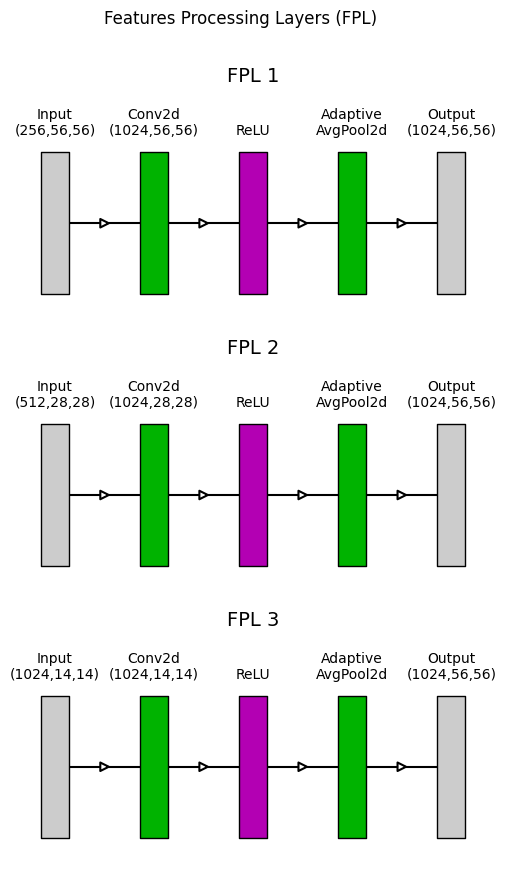

#### Image Features Fusion

This block is designed to combine image features processed by the FPL layers. This step integrates information into a single, unified representation. In [1], the approach used to combine these features was concatenation, in my model I decided to experiment a learnable weight parameter that influence how the features are fused togheter. The idea is that the importance of these features can vary depending on the specific image and thus learnable weights allow the model to dynamically adjust the contribution of each feature during training. After weighting the features are summed and then projected to produce an image embedding that will be the input of the subsequent FiLM block.

The implementation is as follows:

```python

class WeightedFeatureFusion(nn.Module):
    
    def __init__(self, num_features: int, feature_dim: int):
        super(WeightedFeatureFusion, self).__init__()
        self.weights = nn.Parameter(torch.ones(num_features))
        self.projection = nn.Conv2d(feature_dim, feature_dim, kernel_size=1)

    def forward(self, features: list[torch.Tensor]) -> torch.Tensor:

        stacked_features = torch.stack(features, dim=1)
        weighted_features = stacked_features * self.weights.view(1, -1, 1, 1, 1)
        fused_features = weighted_features.sum(dim=1)

        return self.projection(fused_features)

```

The operations performed by the WeightedFeatureFusion module are represented in the diagram below:


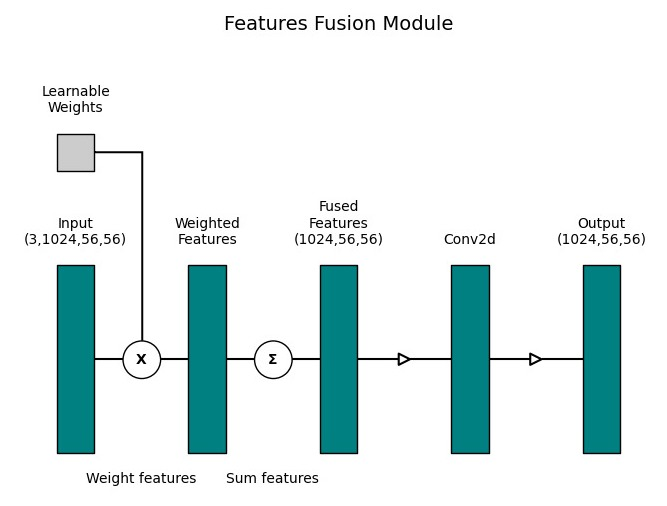

#### Textual Features Extraction

The textual features are directly extracted from the frozen CLIP backbone encoder, ensuring the pretrained model's semantic richness is preserved. These features play two roles in the architecture:

1. **FiLM Conditioning**: The text embeddings are used to condition the fused image features within the **FiLM block**, aligning the visual attention on what the textual description indicate.

2. **Bounding Box Prediction**: The text embeddings are incorporated into the bounding box head to directly influence the localization of objects.


#### Multi-FiLM layer


The Multi-FiLM layer in my model adapts the FiLM mechanism described in [2]. This mechanism was originally designed for tasks such as visual reasoning by modulating feature maps using affine transformations derived from external conditioning inputs. I have made some modification to the original implementation proposed in [2] to adapt it to my context. The original implementation is rapresentend in this image from [2].

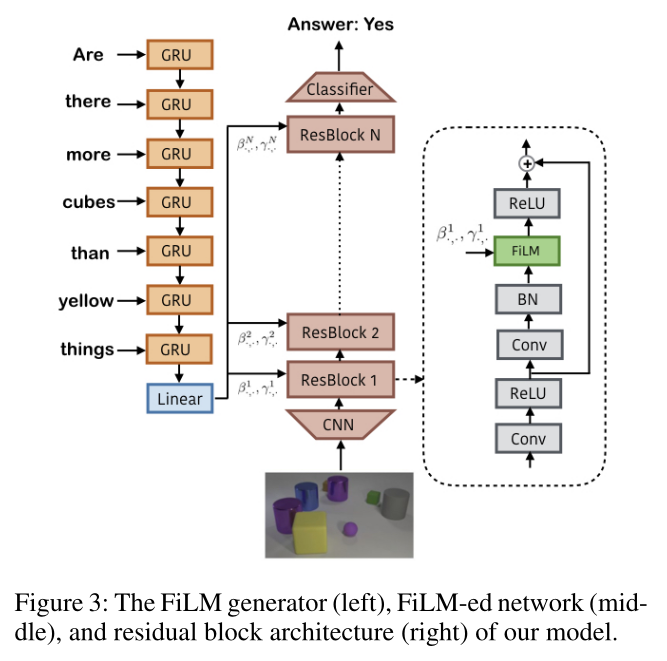

My implementation is presented in the subsequent image.

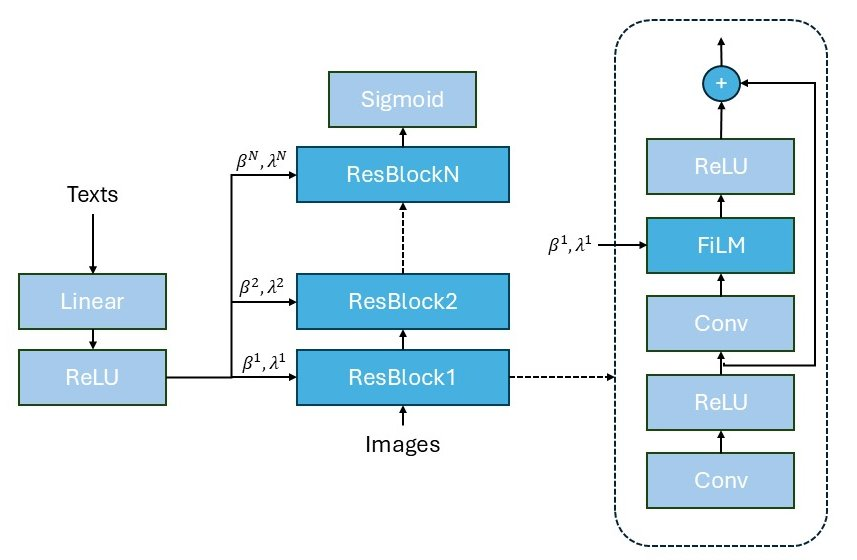


**Key changes**

- It adopt in the final configuration 3 residual block ( different numbers were tested) inside the film layer to condition the image.

- In the original FiLM paper, CNNs were used to extract visual features from raw images. My implementation uses a pre-trained and frozen CLIP visual backbone for feature extraction, which provides pre-trained visual embeddings. This removes the need for an additional CNN.  My model focuses on refining these features from CLIP backbone via FiLM layers.

- The original FiLM paper used GRUs (Gated Recurrent Units) to process sequential text inputs in visual reasoning tasks like CLEVR, which require reasoning over structured questions. My implementation uses CLIP’s pre-trained text embeddings, which already encapsulate semantic information from the input text. Thus, there is no need for a GRU to sequentially process the text. Furthermore, the absence of GRU reduce the computation cost of the architecture (some tests with the GRU during devolopment shown significant increase in execution time).

- As anticipated, FiLM was originally applied to tasks like CLEVR that involve answering visual reasoning questions (e.g., "What is the color of the large sphere?"). This required the classification heads, but my task involves bounding box localization rather than classification. Thus, the FiLM-modulated features are directly used for bounding box prediction, making a classification head unnecessary.

- The batch normalization (BN) step inside each residual block was removed based on suggestions in [2]. The authors of FiLM explicitly state that BN is not a strict requirement for FiLM’s functionality.
Additionally, BN could interfere with the FiLM-generated parameters ($\gamma$, $\beta$), which already perform scaling and shifting operations on feature maps.



##### Key Components

##### 1. **FiLMBlock**:



   - Implements the FiLM equation:
     $$
     \text{FiLM}(F | \gamma, \beta) = \gamma \cdot F + \beta
     $$
     where $ F $ is the input feature map, and $ \gamma, \beta $ are modulation parameters conditionally derived from the external text input.

   - Modulates feature maps channel-wise, with spatial dimensions preserved, enabling task-specific feature adaptation.

```python

    class FiLMBlock(nn.Module):

        def __init__(self):
            super(FiLMBlock, self).__init__()

        def forward(self, x : torch.Tensor, gamma : torch.Tensor, beta : torch.Tensor) -> torch.Tensor:

            beta = beta.view(x.size(0), x.size(1), 1, 1)
            gamma = gamma.view(x.size(0), x.size(1), 1, 1)

            return gamma * x + beta

```

##### 2. **ResBlock**:

   - Combines FiLM-based modulation with a residual structure for hierarchical feature refinement.

   - Components:

     - $ 1 \times 1 $ convolution for channel projection.

     - $ 3 \times 3 $ convolution for spatial feature extraction.

   - Integrates FiLM to dynamically scale and shift features using text-conditioned parameters, improving the network's ability to localize and reason about image regions.

```python

    class ResBlock(nn.Module):

        def __init__(self, in_channels : int, out_channels : int):
            super(ResBlock, self).__init__()
            
            self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1)
            self.relu1 = nn.ReLU(inplace=True)
            self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
            self.film = FiLMBlock()
            self.relu2 = nn.ReLU(inplace=True)  
            
        def forward(self, x : torch.Tensor, gamma : torch.Tensor, beta : torch.Tensor) -> torch.Tensor:

            x = self.conv1(x)
            x = self.relu1(x)
            identity = x

            x = self.conv2(x)

            x = self.film(x, gamma, beta)
            x = self.relu2(x)

            return x + identity
            

```

##### 3. **MultiFiLM**:


   - Stacks multiple FiLM-modulated residual blocks to conditionally refine features across hierarchical levels.

   - A **FiLM Generator** (linear layer) derives $ \gamma $ and $ \beta $ for each block based on textual embeddings, enabling progressive feature conditioning.

   - Outputs a modulated feature map normalized using a sigmoid activation.

```python

class MultiFiLM(nn.Module):

    def __init__(self, feature_dim : int, n_res_blocks : int, text_dim : int):
        super(MultiFiLM, self).__init__()

        self.film_generator = nn.Linear(text_dim, 2 * n_res_blocks * feature_dim)
        self.res_blocks = nn.ModuleList([ResBlock(feature_dim, feature_dim) for _ in range(n_res_blocks)])
        self.sigmoid = nn.Sigmoid()
        self.n_res_blocks = n_res_blocks
        self.feature_dim = feature_dim
        
    def forward(self, features : torch.Tensor, text_embeddings : torch.Tensor) -> torch.Tensor:

        film_vector = F.relu(self.film_generator(text_embeddings)).view(
            features.size(0), self.n_res_blocks, 2, self.feature_dim
        )

        gamma, beta = film_vector[:, :, 0, :], film_vector[:, :, 1, :]
            
        for i, res_block in enumerate(self.res_blocks):
            features = res_block(features, gamma[:, i, :], beta[:, i, :])
                    
        return self.sigmoid(features)


```


To summarize, the Multi-FiLM layer refines image features by dynamically modulating them based on text embeddings. Modifications to the original FiLM design (removal of GRU, CNN, classification heads and batch normalization) ensure the architecture is tailored to visual grounding tasks aligning with the requirements of my architecture.




### Bounding box head



The final component of the architecture is the Bounding Box head, a Multi-Layer Perceptron (MLP) that refines the features from the attention masks and text embeddings to produce a single bounding box. This component bridges the gap between feature representation and the output task of predicting bounding box coordinates.

The image below illustrate the MLP structure (**bbox_head**).


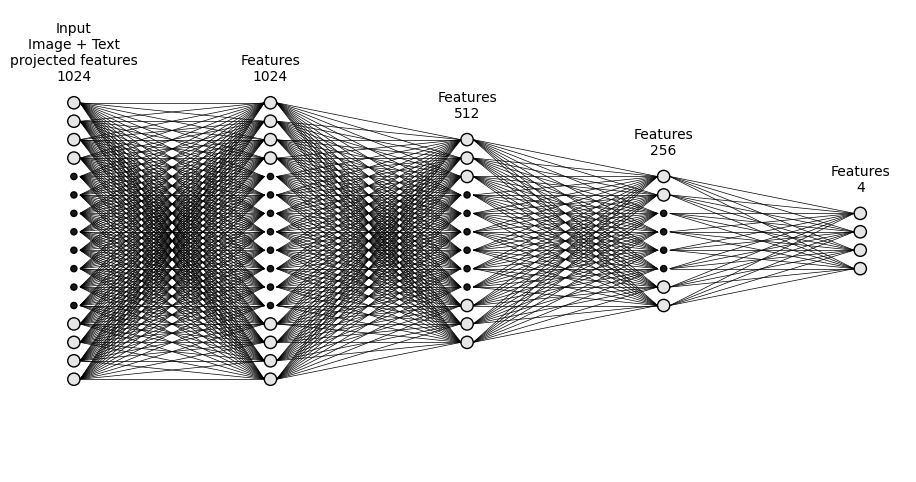

Pooling and Projection:

- Mask Features:

    - The attention mask output from the Multi-FiLM layer is globally pooled using an adaptive average pooling layer (AdaptiveAvgPool2d) to reduce its spatial dimensions.

    - This pooled vector is passed through a linear layer (mask_proj) to project it into the hidden dimension of the MLP.

- Text Features:

    - The text embeddings are similarly projected into the hidden dimension using a linear layer (text_proj).

The projected mask features and text features are then concatenated to form a unified representation that is the input to the MLP. A series of fully connected layers (bbox_mlp) that progressively refines the combined features:

- Non-linearity is introduced using ReLU activations.

- Dropout layers are included to try to improve generalization and mitigating underfitting and overfitting.

- The final layer outputs a vector of size 4, representing the bounding box coordinates [xmin,ymin,xmax,ymax] normalized to [0,1] using a Sigmoid activation.

The code below show the final component of the model architecture.

```python
class BoundingBoxHead(nn.Module):
    
    def __init__(self, mask_dim: int, text_dim: int, hidden_dim: int = 512, dropout_prob: float = 0.2):

        self.mask_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.mask_proj = nn.Linear(mask_dim, hidden_dim)
        self.text_proj = nn.Linear(text_dim, hidden_dim)
        
        self.bbox_mlp = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_prob), 
            nn.Linear(hidden_dim * 2, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout_prob),
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim // 2, 4),
            nn.Sigmoid()
        )

    def forward(self, attention_masks: torch.Tensor, text_embeddings: torch.Tensor) -> torch.Tensor:

        pooled_masks = self.mask_pool(attention_masks).squeeze(-1).squeeze(-1)
        mask_features = self.mask_proj(pooled_masks)
        text_features = self.text_proj(text_embeddings)
        combined_features = torch.cat([mask_features, text_features], dim=1)
        bboxes = self.bbox_mlp(combined_features)

        return bboxes
```



---
## ClipVS evaluation

This section will present the methods used to devolop and use ClipVS.

### ClipVS not trained - Inference

This code can be used to inspect in detail the non trained ClipVS model functioning, examining the output of a forward pass for a single batch. This output allow to inspect the raw features extracted from non trained model and see the intermediate results of the features processing.

Debugging tensor transformation:
Original Tensor Shape: torch.Size([2, 4])
Transformed Tensor Shape: torch.Size([2, 4])
Sample 1: tensor([0.47267, 0.52306, 0.72930, 0.50845], device='cuda:0', grad_fn=<SelectBackward0>) -> tensor([302.51111, 196.67212, 466.75479, 191.17612], device='cuda:0', grad_fn=<SelectBackward0>) (target res.: (np.int64(640), np.int64(376)))
Sample 2: tensor([0.40117, 0.56681, 0.61487, 0.65340], device='cuda:0', grad_fn=<SelectBackward0>) -> tensor([256.74689, 244.29716, 393.51880, 281.61606], device='cuda:0', grad_fn=<SelectBackward0>) (target res.: (np.int64(640), np.int64(431)))
End debugging output
Metric: L1 Losses
Shape: (2,)
Mean: 469.959656, Std: 149.129578
Values: 320.830078 619.089233
Metric: GIoU Losses
Shape: (2,)
Mean: 1.063086, Std: 0.136511
Values: 1.199596 0.926575
Metric: BCE Losses
Shape: (2,)
Mean: 0.530608, Std: 0.129428
Values: 0.401180 0.660036
Metric: IoU Accuracies
Shape: (2,)
Mean: 0.148531, Std: 0.059230
Values: 0.089301 0.207761
Batch deb

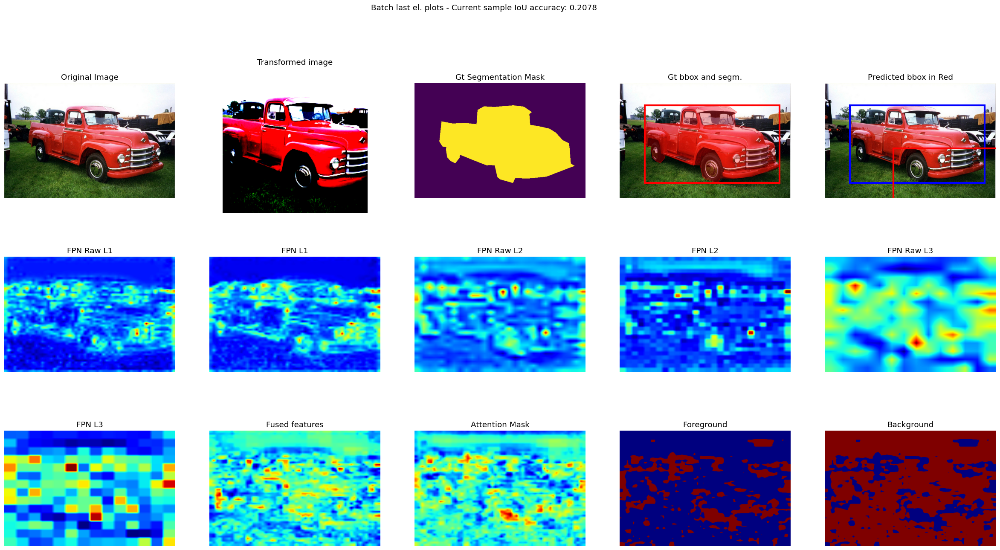

In [12]:
test_forward_pass(config_path="configuration.yaml", dataset=dataset)

### ClipVS - Training

The following cell allow to perform an experiment (training and testing) with a new ClipVS instance. Remember to adjust the configuration properties as needed and reload the configuration and dataset if changes are made.

A script based on the same function of this cell can be found [here](scripts/train_clipvs.py). It can be used to train the model from the console and it was actually used for the experiments presented in the next sections.

In [ ]:
net = ClipVS(config).to(device)
output = experiment(net, dataset, config, note="trexp")

### ClipVS - Grid Search

This is the same function used for the baseline, with the parameter **model** enabling the search to adopt specific mechanisms for ClipVS. It is used here to evaluate different combinations of configuration parameters.

As with the previous **experiment** function, the grid search can also be executed using the script available [here](scripts/grid_search_clipvs.py).


In [ ]:
csv_path = f"{config['output_to']}/clipvs_grid_search_LX_sl{config['dt_samples_limit']}.csv"
grid_search(config, dataset, csv_path, model="ClipVS")

## ClipVS Evaluation Summary

The evaluation of the model was very challenging, particularly in identifying the optimal hyperparameters for its various components. To discover which were the more promising parameter, different model configurations were tested.

These tests followed a grid search approach similar to the baseline methodology.

- **Evaluation on a subset:** the tests were performed on a limited subset of the training set, due to time and resources constrains.

- **Objective:** the primary goal of these tests was to identify configurations that maximize the average Intersection over Union (IoU) accuracy on the test set.

- **Results:** All of these searches with related results are store inside output folder, [here](output/). There are 3 main grid search files that can be inspected: *clipvs_grid_search_L1_sl0.2*,  *clipvs_grid_search_L2_sl0.8*, *clipvs_grid_search_L3_sl10*. In these files names the "L*" is an id to distinguish and order the searches made and the "sl*" indicate the percentage of the dataset used for training.


### Grid searches results:
---

#### Ordered columns of grid search files

In [14]:
cols = [
    'avg_iou_accuracy',
    'device',
    'dataset_path',
    'dt_samples_limit',
    'dt_templates',
    'dt_apply_template',
    'dt_extra_similar_sents',
    'dt_sents_vector_type',
    'dt_ess_sm_batch_size',
    'dt_ess_sm_k',
    'nn_epochs',
    'nn_batch_size',
    'nn_optimizer',
    'nn_opt_learning_rate',
    'nn_opt_momentum',
    'nn_l1_lambda',
    'nn_bce_lambda',
    'nn_giou_lambda',
    'nn_fg_bg_percentile',
    'nn_dropout_prob',
    'nn_scheduler',
    'nn_scheduler_power',
    'nn_use_scheduler',
    'nn_grad_clipping',
    'nn_wd',
    'nn_film_layers',
    'nn_bbox_hidden_dim',
]


---
#### **Grid search L1** - 0.2 % of the training set - 512 Tests


This initial grid search aimed to establish a foundational understanding of the model’s behavior with minimal computational expense. By using a very small subset of the training data, the goal was to identify critical configurations, such as the number of FiLM layers, optimizer settings and the impact of loss components. This phase served as a baseline for exploring parameters.

- **Parameters values tested**

    - gs_nn_film_layers: [2, 4]
    - gs_nn_scheduler: [True]
    - gs_nn_scheduler_power: [0.7, 1.0]
    - gs_nn_grad_clipping: [False]
    - gs_nn_optimizer: ['AdamW']
    - gs_nn_dropout_prob: [0.2, 0.4]
    - gs_nn_opt_learning_rate: [1e-05, 0.0001]
    - gs_nn_bbox_hidden_dim: [512, 1024]
    - gs_nn_wd: [1e-06, 1e-05]
    - gs_nn_giou_lambda: [1]
    - gs_nn_l1_lambda: [0.0, 0.001]
    - gs_nn_bce_lambda: [0, 1]

- **Best parameters configuration** based on avg_iou_accuracy

    - gs_nn_film_layers: 2
    - gs_nn_scheduler: True
    - gs_nn_scheduler_power: 0.7
    - gs_nn_grad_clipping: False
    - gs_nn_optimizer: AdamW
    - gs_nn_dropout_prob: 0.4
    - gs_nn_opt_learning_rate: 1e-05
    - gs_nn_bbox_hidden_dim: 512
    - gs_nn_wd: 1e-05
    - gs_nn_giou_lambda: 1
    - gs_nn_l1_lambda: 0.0
    - gs_nn_bce_lambda: 0

##### Results inspection


In [15]:
df = analyze_csv(csv_path="output/clipvs_grid_search_L1_sl0.2.csv")
df[cols][:5]

Parameters values tested:

gs_nn_film_layers: [2, 4]
gs_nn_scheduler: [True, False]
gs_nn_scheduler_power: [0.7, 1.0]
gs_nn_grad_clipping: [False]
gs_nn_optimizer: ['AdamW']
gs_nn_dropout_prob: [0.2, 0.4]
gs_nn_opt_learning_rate: [1e-05, 0.0001]
gs_nn_bbox_hidden_dim: [512, 1024]
gs_nn_wd: [1e-06, 1e-05]
gs_nn_giou_lambda: [1]
gs_nn_l1_lambda: [0.0, 0.001]
gs_nn_bce_lambda: [0, 1]

Best parameters configuration based on avg_iou_accuracy

gs_nn_film_layers: 2
gs_nn_scheduler: True
gs_nn_scheduler_power: 0.7
gs_nn_grad_clipping: False
gs_nn_optimizer: AdamW
gs_nn_dropout_prob: 0.4
gs_nn_opt_learning_rate: 1e-05
gs_nn_bbox_hidden_dim: 512
gs_nn_wd: 1e-05
gs_nn_giou_lambda: 1
gs_nn_l1_lambda: 0.0
gs_nn_bce_lambda: 0

Top 5 combinations:



,avg_iou_accuracy,device,dataset_path,dt_samples_limit,dt_templates,...,nn_use_scheduler,nn_grad_clipping,nn_wd,nn_film_layers,nn_bbox_hidden_dim
36,0.248400,cuda,dataset/refcocog,0.200000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000010,2,512
364,0.242200,cuda,dataset/refcocog,0.200000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000010,4,1024
256,0.237400,cuda,dataset/refcocog,0.200000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,4,512
196,0.237100,cuda,dataset/refcocog,0.200000,"['a photo of {}', '{} in the picture', '{} in ...",...,False,False,0.000010,2,512
317,0.232400,cuda,dataset/refcocog,0.200000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000010,4,1024



---
#### **Grid search L2** - 0.8 % of the training set - 189 Tests


Building on L1, this search focused on refining the parameters configuration using a slightly larger training subset. The number of FiLM layers was fixed at 3 and the dropout probability was reduced to a middle value, 0.3,  based on observations from top L1 configurations. Loss coefficients (GIoU, L1, BCE) were further varied to identify balanced trade-offs for training stability and IoU accuracy.

The dropout probability (0.3) and loss coefficients (GIoU = 2, BCE = 2) showed the best results in L2. FiLM layers were maintained at 3, while the bounding box MLP hidden dimension was again optimal at 512.

- **Parameters values tested**:

    -  gs_nn_film_layers: [3]
    -  gs_nn_scheduler: [True]
    -  gs_nn_scheduler_power: [0.7]
    -  gs_nn_grad_clipping: [False]
    -  gs_nn_optimizer: ['AdamW']
    -  gs_nn_dropout_prob: [0.3]
    -  gs_nn_opt_learning_rate: [1e-05]
    -  gs_nn_bbox_hidden_dim: [256, 512, 1024]
    -  gs_nn_wd: [1e-06]
    -  gs_nn_giou_lambda: [0, 1, 2, 4]
    -  gs_nn_l1_lambda: [0.0, 0.001, 0.005, 0.0001]
    -  gs_nn_bce_lambda: [0, 1, 2, 4]


- **Best parameters configuration** based on avg_iou_accuracy

    -  gs_nn_film_layers: 3
    -  gs_nn_scheduler: True
    -  gs_nn_scheduler_power: 0.7
    -  gs_nn_grad_clipping: False
    -  gs_nn_optimizer: AdamW
    -  gs_nn_dropout_prob: 0.3
    -  gs_nn_opt_learning_rate: 1e-05
    -  gs_nn_bbox_hidden_dim: 512
    -  gs_nn_wd: 1e-06
    -  gs_nn_giou_lambda: 2
    -  gs_nn_l1_lambda: 0.0
    -  gs_nn_bce_lambda: 2



##### Results inspection


In [16]:
df2 = analyze_csv(csv_path="output/clipvs_grid_search_L2_sl0.8.csv", plot_loss_charts = False)
df2[cols][:5]

Parameters values tested:

gs_nn_film_layers: [3]
gs_nn_scheduler: [True]
gs_nn_scheduler_power: [0.7]
gs_nn_grad_clipping: [False]
gs_nn_optimizer: ['AdamW']
gs_nn_dropout_prob: [0.3]
gs_nn_opt_learning_rate: [1e-05]
gs_nn_bbox_hidden_dim: [256, 512, 1024]
gs_nn_wd: [1e-06]
gs_nn_giou_lambda: [0, 1, 2, 4]
gs_nn_l1_lambda: [0.0, 0.001, 0.005, 0.0001]
gs_nn_bce_lambda: [1, 2, 4, 0]

Best parameters configuration based on avg_iou_accuracy

gs_nn_film_layers: 3
gs_nn_scheduler: True
gs_nn_scheduler_power: 0.7
gs_nn_grad_clipping: False
gs_nn_optimizer: AdamW
gs_nn_dropout_prob: 0.3
gs_nn_opt_learning_rate: 1e-05
gs_nn_bbox_hidden_dim: 512
gs_nn_wd: 1e-06
gs_nn_giou_lambda: 2
gs_nn_l1_lambda: 0.0
gs_nn_bce_lambda: 2

Top 5 combinations:



,avg_iou_accuracy,device,dataset_path,dt_samples_limit,dt_templates,...,nn_use_scheduler,nn_grad_clipping,nn_wd,nn_film_layers,nn_bbox_hidden_dim
96,0.267600,cuda,dataset/refcocog,0.800000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,3,512
176,0.265100,cuda,dataset/refcocog,0.800000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,3,1024
108,0.264000,cuda,dataset/refcocog,0.800000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,3,512
172,0.262200,cuda,dataset/refcocog,0.800000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,3,1024
81,0.262100,cuda,dataset/refcocog,0.800000,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,3,512



---
#### **Grid search L3** - 10 % of the training set - 14 Tests

The final grid search aimed to validate the refined hyperparameters on a larger subset of the dataset. Gradient clipping, previously disabled, was introduced as a variable. Dropout probability (0.3) and other fixed parameters from L2 were maintained. Loss coefficients were tested again to see the behaviour of the model with the larger dataset.

The top configurations of this search was then used as configuration for the 3 main experiments performed.

-  gs_nn_film_layers: [3]
-  gs_nn_scheduler: [True]
-  gs_nn_scheduler_power: [0.7]
-  gs_nn_grad_clipping: [True, False]
-  gs_nn_optimizer: ['AdamW']
-  gs_nn_dropout_prob: [0.3]
-  gs_nn_opt_learning_rate: [1e-05]
-  gs_nn_bbox_hidden_dim: [512]
-  gs_nn_wd: [1e-06]
-  gs_nn_giou_lambda: [0, 2]
-  gs_nn_l1_lambda: [0.0, 0.001]
-  gs_nn_bce_lambda: [2, 0]

Best parameters configuration based on avg_iou_accuracy

-  gs_nn_film_layers: 3
-  gs_nn_scheduler: True
-  gs_nn_scheduler_power: 0.7
-  gs_nn_grad_clipping: True
-  gs_nn_optimizer: AdamW
-  gs_nn_dropout_prob: 0.3
-  gs_nn_opt_learning_rate: 1e-05
-  gs_nn_bbox_hidden_dim: 512
-  gs_nn_wd: 1e-06
-  gs_nn_giou_lambda: 2
-  gs_nn_l1_lambda: 0.001
-  gs_nn_bce_lambda: 0

##### Results inspection

In [17]:
df3 = analyze_csv(csv_path="output/clipvs_grid_search_L3_sl10.csv", plot_loss_charts = False)
df3[cols][:2]

Parameters values tested:

gs_nn_film_layers: [3]
gs_nn_scheduler: [True]
gs_nn_scheduler_power: [0.7]
gs_nn_grad_clipping: [True, False]
gs_nn_optimizer: ['AdamW']
gs_nn_dropout_prob: [0.3]
gs_nn_opt_learning_rate: [1e-05]
gs_nn_bbox_hidden_dim: [512]
gs_nn_wd: [1e-06]
gs_nn_giou_lambda: [0, 2]
gs_nn_l1_lambda: [0.0, 0.001]
gs_nn_bce_lambda: [2, 0]

Best parameters configuration based on avg_iou_accuracy

gs_nn_film_layers: 3
gs_nn_scheduler: True
gs_nn_scheduler_power: 0.7
gs_nn_grad_clipping: True
gs_nn_optimizer: AdamW
gs_nn_dropout_prob: 0.3
gs_nn_opt_learning_rate: 1e-05
gs_nn_bbox_hidden_dim: 512
gs_nn_wd: 1e-06
gs_nn_giou_lambda: 2
gs_nn_l1_lambda: 0.001
gs_nn_bce_lambda: 0

Top 5 combinations:



,avg_iou_accuracy,device,dataset_path,dt_samples_limit,dt_templates,...,nn_use_scheduler,nn_grad_clipping,nn_wd,nn_film_layers,nn_bbox_hidden_dim
5,0.242300,cuda,dataset/refcocog,10,"['a photo of {}', '{} in the picture', '{} in ...",...,True,True,0.000001,3,512
13,0.242300,cuda,dataset/refcocog,10,"['a photo of {}', '{} in the picture', '{} in ...",...,True,False,0.000001,3,512



---



### Experiments


The following section describe the three experiments conducted to evaluate the ClipVS model. Each experiment aimed to assess the impact of specific configurations, focusing on the BCE loss component and its interaction with other loss terms. The experiments leveraged the configurations obtained from the L3 grid search discussed earlier. The following top two configurations were used respectively for experiment 1 and 2.


<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>avg_iou_accuracy</th>
      <th>device</th>
      <th>dataset_path</th>
      <th>dt_samples_limit</th>
      <th>dt_templates</th>
      <th>dt_apply_template</th>
      <th>dt_extra_similar_sents</th>
      <th>dt_sents_vector_type</th>
      <th>dt_ess_sm_batch_size</th>
      <th>dt_ess_sm_k</th>
      <th>nn_epochs</th>
      <th>nn_batch_size</th>
      <th>nn_optimizer</th>
      <th>nn_opt_learning_rate</th>
      <th>nn_opt_momentum</th>
      <th>nn_l1_lambda</th>
      <th>nn_bce_lambda</th>
      <th>nn_giou_lambda</th>
      <th>nn_fg_bg_percentile</th>
      <th>nn_dropout_prob</th>
      <th>nn_scheduler</th>
      <th>nn_scheduler_power</th>
      <th>nn_use_scheduler</th>
      <th>nn_grad_clipping</th>
      <th>nn_wd</th>
      <th>nn_film_layers</th>
      <th>nn_bbox_hidden_dim</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>5</th>
      <td>0.242300</td>
      <td>cuda</td>
      <td>dataset/refcocog</td>
      <td>10</td>
      <td>['a photo of {}', '{} in the picture', '{} in ...</td>
      <td>True</td>
      <td>False</td>
      <td>Mean</td>
      <td>512</td>
      <td>1</td>
      <td>3</td>
      <td>32</td>
      <td>AdamW</td>
      <td>0.000010</td>
      <td>0.900000</td>
      <td>0.001000</td>
      <td>0</td>
      <td>2</td>
      <td>80</td>
      <td>0.300000</td>
      <td>True</td>
      <td>0.700000</td>
      <td>True</td>
      <td>True</td>
      <td>0.000001</td>
      <td>3</td>
      <td>512</td>
    </tr>
    <tr>
      <th>13</th>
      <td>0.242300</td>
      <td>cuda</td>
      <td>dataset/refcocog</td>
      <td>10</td>
      <td>['a photo of {}', '{} in the picture', '{} in ...</td>
      <td>True</td>
      <td>False</td>
      <td>Mean</td>
      <td>512</td>
      <td>1</td>
      <td>3</td>
      <td>32</td>
      <td>AdamW</td>
      <td>0.000010</td>
      <td>0.900000</td>
      <td>0.001000</td>
      <td>2</td>
      <td>2</td>
      <td>80</td>
      <td>0.300000</td>
      <td>True</td>
      <td>0.700000</td>
      <td>True</td>
      <td>False</td>
      <td>0.000001</td>
      <td>3</td>
      <td>512</td>
    </tr>
  </tbody>
</table>
</div>

The configurations of the 3 experiments are almost identical except for the BCE lambda.

- Experiment 1: BCE Lambda is set to 2 for the entire training process.
- Experiment 2: BCE Lambda is completely excluded (set to 0).
- Experiment 3: BCE Lambda is initially set to 2 for the first 10 epochs and then switched to 0 for the remaining epochs.

In the three experiments the models were trained for 50 epoch using 50% of the training set, validated using the entire validation split and tested on the entire test set.

##### Results Summary

The following table summarizes the average IoU accuracy achieved in each experiment.

| Experiment | Epochs | BCE Loss component | Average IoU Accuracy (%)     |
|------------|--------|----------|------------------------------|
| Experiment 1 | 50 | Used                              | 24.72 |
| Experiment 2 | 50 | Not Used                          | 26.85 |
| Experiment 3 | 50 | Used for the first 10 epochs only | 24.87 |


The next sections presents the experiments performed, each of them has two charts, one for the training and validation loss trend and the other which show the trend of each loss component.



---

#### Experiment 1 - With BCE Loss component



The behavior of the training and validation loss in Experiment 1 is unusual. The lack of a clear downward trend in both losses suggests that the model struggle to learn effectively from the training data, under the current configuration. Several factors might have contributed to this behavior:

- **Imbalanced Loss Components**: The inclusion of the BCE loss throughout the training might have dominated the contributions of GIoU and Smooth L1. In other words, the BCE loss appears to have played a disproportionately large role in this experiment, as evidenced by its high fluctuations.

- **Loss Dynamics**: While GIoU and Smooth L1 losses contributed consistently, they showed minimal reductions over the epochs. This lack of significant minimization is similar with the results of subsequent experiments, suggesting that the BCE loss might have a negative impact to the overall optimization, but there are other factors to investigate.

- **Dataset Subset Size**: Since the training was performed on a subset of the dataset (50%), there could be insufficient data diversity to drive an effective learning for my model.

- **Performance**: the model achieved an average IoU accuracy of 24.72% on the test set. It indicates a poor performance, possibly due to issues discussed above.

To summarize, the results indicate an evident problem in the training dynamics. The model might not have been optimizing effectively due to parameters misconfiguration, imbalanced loss contributions or insufficient dataset diversity and epochs of training. Anyway the result of the subsequent experiment are an indicator that an important limitation could be the BCE loss component.

##### Loss chart

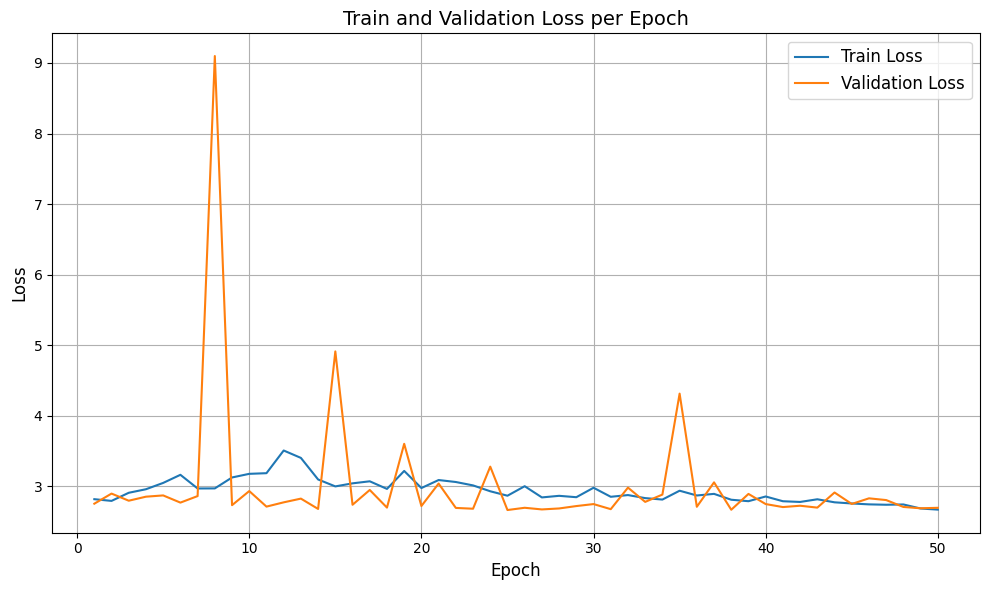

##### Loss components chart

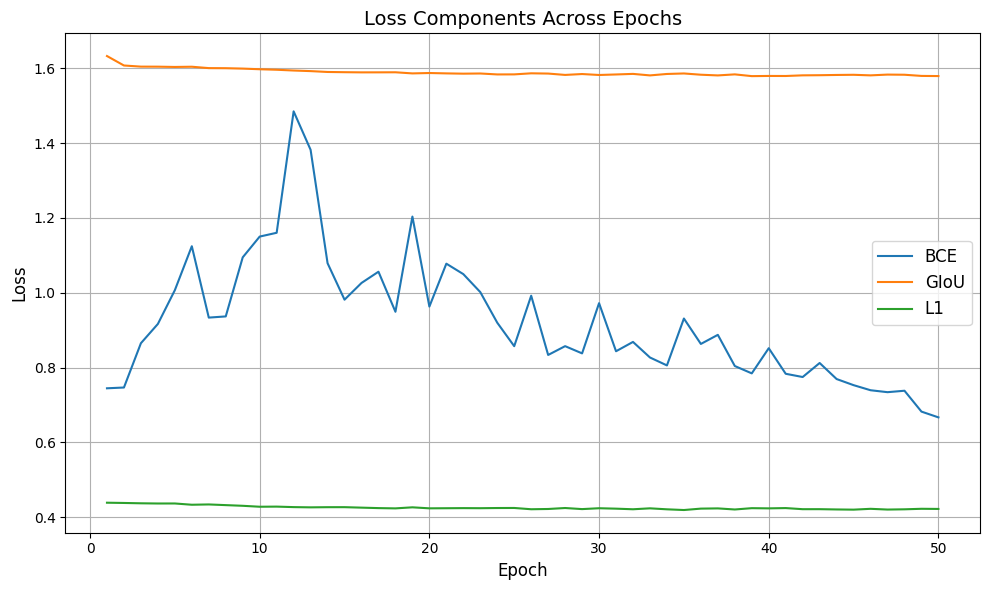


---

#### Experiment 2 - Without BCE Loss component

Experiment 2 excluded the BCE loss component entirely, resulting in a more stable learning process compared to Experiment 1. This modification significantly affected the training dynamics and overall performance:

- **Improved Loss Behavior**: The training and validation losses both showed downward trends, demonstrating a more effective optimization and learning stability than experiment 1. This improvement highlights that removing the BCE loss component reduced interference and allowed the GIoU and Smooth L1 losses to drive the training process.

- **Loss Component Contributions**: Both the GIoU and L1 losses show a downward trend. However, the extent of minimization remained limited, reflecting suboptimal learning and limited alignment between predicted and ground truth bounding boxes. This aligns with the low IoU accuracy achieved.

- **Performance**: The model achieved an average IoU accuracy of 26.85%, the highest among the three experiments. Despite this improvement, the result is still poor and indicates inadequate visual grounding capabilities. 

Also in this experiment, the poor performances can stem from several factors, including insufficient training data (only 50% of the dataset was used) or the need for longer training. Additionally, by the end of the current experiment, the trends in the training and validation losses suggest early signs of overfitting, further constraining the model's potential for improvement.

To conclude, while removing the BCE loss component addressed some of the instability observed in Experiment 1, the resulting performance still highlights fundamental limitations in the current setup.

##### Loss chart

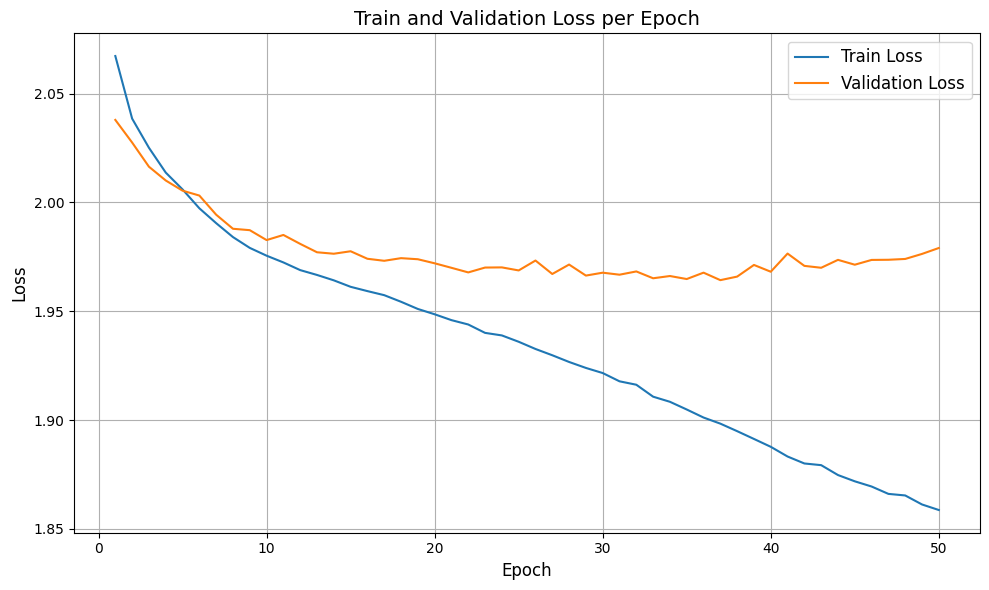

##### Loss components chart

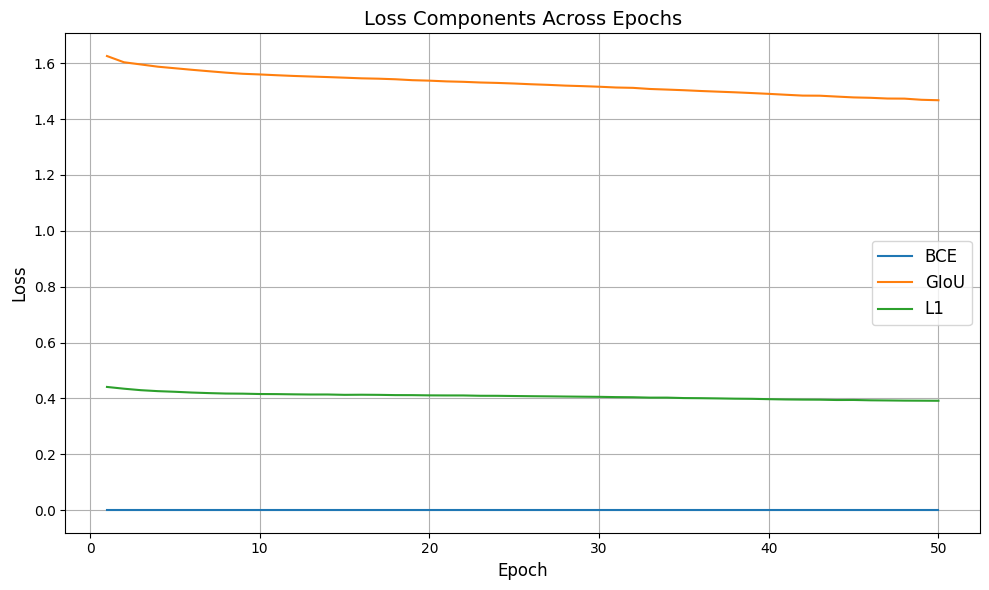


---

#### Experiment 3 - Without BCE Loss component



In Experiment 3, the BCE loss was applied only for the first 10 epochs, after which it was set to zero. The rationale behind this experiment was to investigate the effect of the BCE loss observed in Experiment 1, which demonstrated unusual training dynamics. The first 10 epochs of this experiment are identical to those of Experiment 1. Beyond epoch 10, the model was trained without the BCE loss component.

- **Loss Behavior**: During the first 10 epochs, the loss patterns are the same of Experiment 1, exhibiting unstable behavior. After removing the BCE loss, the training and validation losses stabilized, similarly to Experiment 2.

- **Performance**: The model achieved an average IoU accuracy of 24.87% on the test set. While this is slightly better than Experiment 1 (24.72%) but worse than Experiment 2 (26.85%).

The early use of the BCE loss negatively impacted the model's final performance. When compared to Experiment 2, the introduction of BCE loss for 10 epochs resulted in a drop of ~7.5 % in IoU accuracy. This support the hypothesis that the BCE loss interferes with effective optimization in my actual model architecture.

##### Loss chart

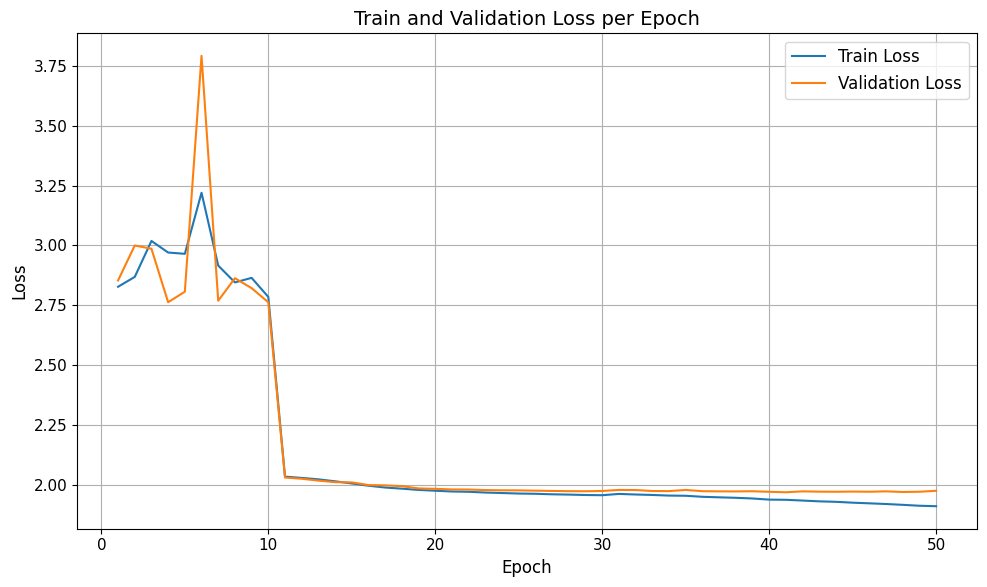

##### Loss components chart

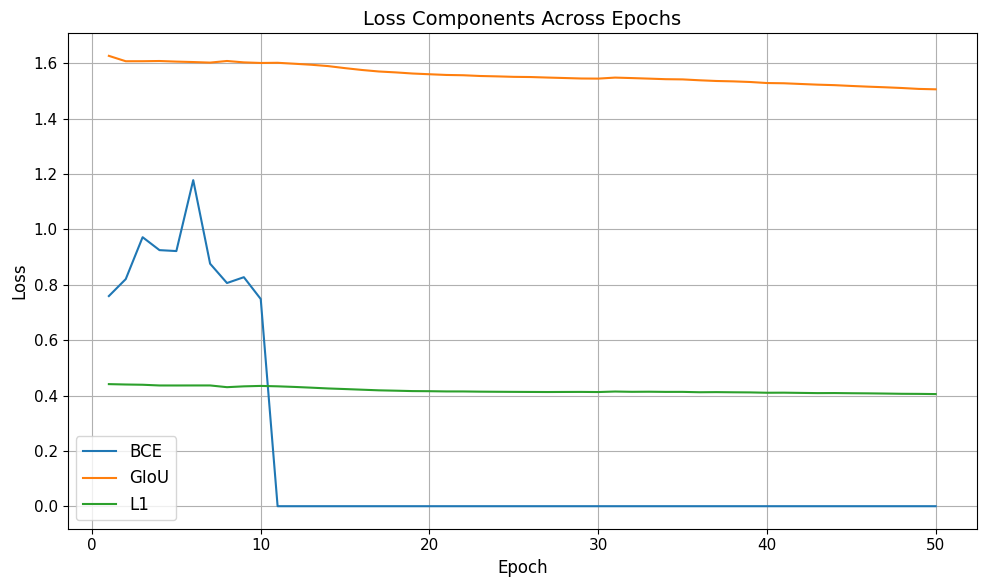

---

#### ClipVS Pre-trained - Inference

The followin cell can be used to perform inference on arbitrary samples using the weights from one of the available experiments. Adjust **weights_path** to point to the desired experiment's weights and the pre-trained model will be used to perform visual grounding on the specified sample.


Sample 1 information:
Sample dataframe (sample_df)


 ┌───────────────┬──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
│               │ 1                                                                                                                                                                                                                                                                      

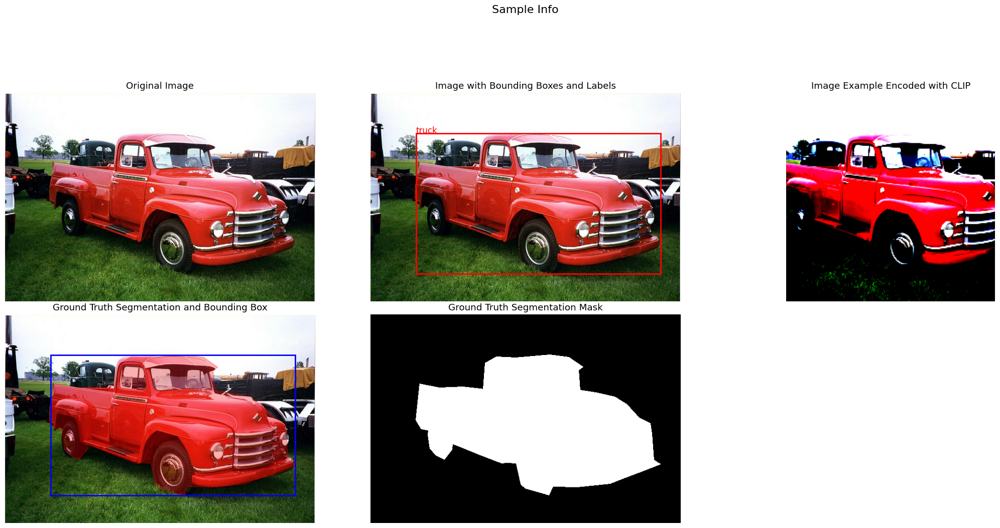

Total number of trainable parameters: 45372935/147380072
Debug forward output

imgs_embeddings:
  Shape: torch.Size([1, 1024])
  Type: torch.float32
  Device: cuda:0
  Gradient: None
  Min: -0.418545, Max: 0.181703
  Mean: -0.000004, Std: 0.031265

fpn_imgs_l1:
  Shape: torch.Size([1, 1024, 56, 56])
  Type: torch.float32
  Device: cuda:0
  Gradient: <AdaptiveAvgPool2DBackward0 object at 0x72f24843e7d0>
  Min: 0.000000, Max: 8.518082
  Mean: 0.550922, Std: 0.879205

fpn_imgs_l2:
  Shape: torch.Size([1, 1024, 56, 56])
  Type: torch.float32
  Device: cuda:0
  Gradient: <AdaptiveAvgPool2DBackward0 object at 0x72f24843e7d0>
  Min: 0.000000, Max: 7.729014
  Mean: 0.748444, Std: 1.092241

fpn_imgs_l3:
  Shape: torch.Size([1, 1024, 56, 56])
  Type: torch.float32
  Device: cuda:0
  Gradient: <AdaptiveAvgPool2DBackward0 object at 0x72f24843e7d0>
  Min: 0.000000, Max: 8.344711
  Mean: 0.990271, Std: 1.179182

fpn_imgs_l1_raw:
  Shape: torch.Size([1, 256, 56, 56])
  Type: torch.float32
  Device: c

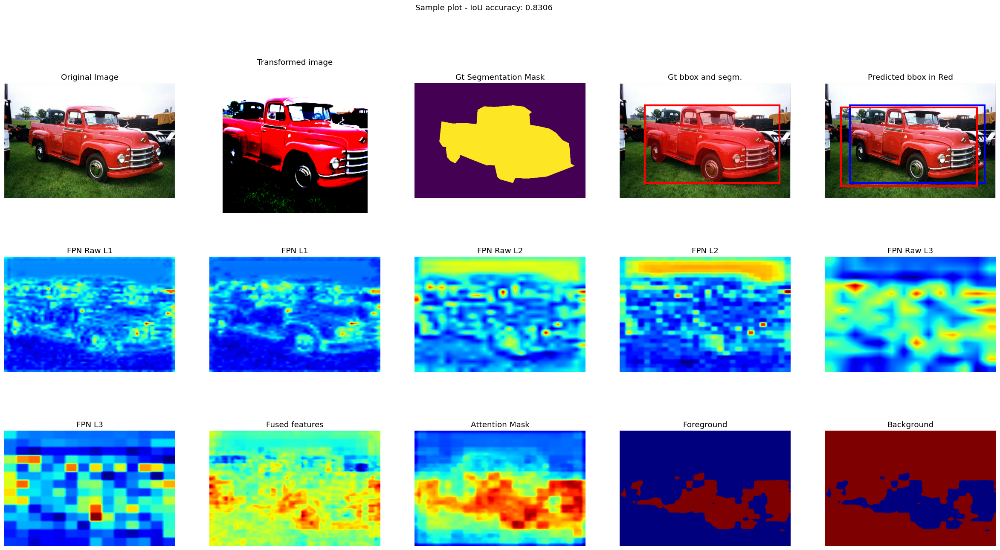

In [18]:

# Experiment 1: "output/ClipVS_experiments/experiment_1_maintr/model_weights.pth"
# Experiment 2: "output/ClipVS_experiments/experiment_2_maintr/model_weights.pth"
# Experiment 31 (10 epochs of training): "output/ClipVS_experiments/experiment_31_maintr/model_weights.pth"
# Experiment 32 (Exp. 31 + 40 epochs without BCE): "output/ClipVS_experiments/experiment_32_maintr/model_weights.pth"

weights_path = "output/ClipVS_experiments/experiment_2_maintr/model_weights.pth"
SAMPLE_ID = 1

sample = collate_fn([dataset['test'].__getitem__(SAMPLE_ID)], device)
sample_info(dataset['test'], SAMPLE_ID)

net = ClipVS(config).to(device)
net.load_state_dict(torch.load(weights_path, weights_only=True))
net.eval()

print(f"Total number of trainable parameters: {sum(p.numel() for p in net.parameters() if p.requires_grad)}/{sum(p.numel() for p in net.parameters())}")

output = net(sample)

postprocessing(sample, output, config)
loss, components = custom_loss(sample, output, config)

debug_tensors(output, title="Debug forward output")    
debug_tensor_transformation(output["orig_bboxes"], output["pred_bboxes"], sample['imgs_dims'])
debug_plotting(sample, output, title=f"Sample plot - IoU accuracy: {round(output['iou_accuracies'].item(), 4)}")


---
---

## Conclusion

The goal of this project was to leverage CLIP, a pre-trained vision-language model, and adapt it for the task of visual grounding. While the methodology was thoughtfully designed, the results highlight significant challenges in defining an architecture capable of achieving baseline performance.

### Baseline Comparison
The baseline approach outperformed the ClipVS model significantly, demonstrating higher performance with greater simplicity and effectiveness. This underscores the robustness of the baseline approach in comparison to the more complex ClipVS model.

### ClipVS Performance
A lot of trials were made to optimize the architecture and loss components for ClipVS. Beyond the experiments presented, numerous configurations were tested to refine the architecture components. The implementation and experiment presented here represent the most effective approach based on the strategy explored during the project.

### Challenges and Observations

1. **Optimization Difficulties**: 
   Across all experiments, the ClipVS model struggled to optimize effectively. The IoU accuracy remained consistently low, with a maximum value of only **26.85%**. This highlights the model's difficulty in establishing robust connections between visual features and textual descriptions.

   - **Loss Design Issues**: The inclusion of BCE loss introduced instability during training (Experiment 1), and even when its use was reduced (Experiment 3), improvements were marginal. The best performance was observed in Experiment 2, where the BCE loss was excluded entirely. However, the results were still far from satisfactory.


3. **Architectural Limitations**:
   While the pre-trained CLIP backbone provided a strong foundation, the additional components introduced for visual grounding (e.g., FiLM blocks and the bounding box head) may not have been sufficiently powerful or well-aligned with the specific requirements of the task. Visual grounding requires precise spatial and contextual understanding, which may not have been adequately captured by the current implementation. Additionally, the limited reduction in key loss metrics across experiments potentially indicate to architectural inefficiencies.


The results suggest that while the idea of adapting CLIP for visual grounding is promising, the current implementation is not effective. The project highlighted several areas for improvement, particularly in loss function design and architecture optimization.

Despite not achieving the desired outcomes, this project provided valuable insights into the complexities of adapting pre-trained multi-modal models for specialized applications. Furthermore, it served as a practical exploration in applying the theory and tools presented during the course for developing and training deep neural networks. This project will undoubtedly inform future works or projects.


---

## References


[1] Linhui Xiao, Xiaoshan Yang, Fang Peng, Ming Yan, Yaowei Wang, Changsheng Xu. CLIP-VG: Self-paced Curriculum Adapting of CLIP for Visual Grounding https://arxiv.org/abs/2305.08685

[2] Ethan Perez, Florian Strub, Harm de Vries, Vincent Dumoulin, Aaron Courville. FiLM: Visual Reasoning with a General Conditioning Layer https://arxiv.org/abs/1709.07871

[3] Haiyang Xu, Qinghao Ye, Ming Yan, Yaya Shi, Jiabo Ye, Yuanhong Xu, Chenliang Li, Bin Bi, Qi Qian, Wei Wang, Guohai Xu, Ji Zhang, Songfang Huang, Fei Huang, Jingren Zhou. mPLUG-2: A Modularized Multi-modal Foundation Model Across Text, Image and Video. https://arxiv.org/abs/2302.00402

[4] Junnan Li, Dongxu Li, Caiming Xiong, Steven Hoi. BLIP: Bootstrapping Language-Image Pre-training for Unified Vision-Language Understanding and Generation. https://arxiv.org/abs/2201.12086